In [ ]:
uw_colors = ["#4B2E83", "#85754D", "#B7A57A", "#E8E3D3", "#D6A15D", "#7C2529", "#8F8B8B", "#5D5D5D", "#292826"]

# Load libraries

In [ ]:
import pandas as pd
import os
import numpy as np
from tqdm import tqdm
import re
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
tqdm.pandas()
import warnings
warnings.filterwarnings("ignore")

## Load user data

In [ ]:
engine = connect_psql()

In [ ]:
schema_name = "research"
table_name = "table.name"

query = f"SELECT * FROM {schema_name}.{table_name}"

with engine.connect() as conn:
    df_user = pd.read_sql(query, conn)

In [ ]:
df_active = df_user[df_user['status'] == 'Active']
df_active['open_account'] = pd.to_datetime(df_active['created'], unit='ms')

In [9]:
df_active = df_active[['id', 'email', 'organization', 'role', 'schoolZipCode', 
                       'schoolName', 'educational_levels','grades', 'subjects', 'sped', 'mll', 
                       'languages', 'open_account', 'standardized_organization', 'county', 'state', 'region']]

In [11]:
df_active['id'].nunique()

6608

# Load data

* user data as of 02/10/2025
* Current table
    * usage_analysis_v12: usage analysis for educational levels, subjects, educational context, pedagogical aspects, and instructional practices
    * usage_analysis_eval: evaluation results of response accuracy, response usefulness, response relevance 

In [ ]:
schema_name = "research"
table_name = "usage_analysis_v12"

query = f"SELECT * FROM {schema_name}.{table_name}"

with engine.connect() as conn:
    df = pd.read_sql(query, conn)

In [ ]:
schema_name = "research"
table_name = "usage_analysis_eval"

query = f"SELECT * FROM {schema_name}.{table_name}"

with engine.connect() as conn:
    dfr = pd.read_sql(query, conn)

In [ ]:
dfr = dfr[["id", "Request Accuracy", "Request Clarity and Specificity", 
           "Response Accuracy", "Response Usefulness", "Response Relevance",
          "Followup Dynamics", "Response Category"]]

# Sum Stats

In [18]:
numeric_sum = df.select_dtypes(include=['number']).sum()
numeric_sum_df = numeric_sum.reset_index()
numeric_sum_df.columns = ['Column', 'Sum']

## Variable Groups

In [20]:
edu_li = ["PreK", "Elementary School", "Middle School", "High School", "College", "Adult"]

In [21]:
content_li = [
    "Administrators and Staff Communication",
    "Formative Assessment",
    "Progress Monitoring and Data Tracking",
    "Project-Based Assessment",
    "Provide Feedback for Assessment",
    "Rubrics and Grading",
    "Summative Assessment",
    "Communicate with Community and Parents",
    "Aligning Instruction Materials with Learning Standards",
    "Backward Planning and Long-Term Planning for Unit or Semester", 
    "Design or Adjust Classroom Activities",
    "Plan for an Entire Lesson",
    "Teacher Learning and Professional Learning Community (PLC)",
    "Training and Workshops"
]

In [22]:
assessment_li = [
    "Formative Assessment",
    "Progress Monitoring and Data Tracking",
    "Project-Based Assessment",
    "Provide Feedback for Assessment",
    "Rubrics and Grading",
    "Summative Assessment"
]

df['Assessment'] = df[assessment_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

lesson_li = [
    "Aligning Instruction Materials with Learning Standards",
    "Backward Planning and Long-Term Planning for Unit or Semester", 
    "Design or Adjust Classroom Activities",
    "Plan for an Entire Lesson"
]

df['Lesson'] = df[lesson_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

pd_li = [
    "Teacher Learning and Professional Learning Community (PLC)",
    "Teacher Training and Workshops"
]

df['PD'] = df[pd_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

communication_li = [
    "Administrators and Staff Communication",
    "Communicate with Community and Parents"
]

df['Communication'] = df[communication_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)


In [23]:
broad_content_li =[
    "Assessment", "Communication", "Lesson", "PD"
]

In [24]:
sd_li= [
    "Gallery Walk",
    "Student Discourse"
]

df['Student Discourse'] = df[sd_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

In [25]:
practices = """    <Practice>Differentiation and Accessibility/Differentiated Instruction and Engagement Strategies</Practice>
                    <Practice>Differentiation and Accessibility/Special Needs Accommodations</Practice>
                    <Practice>Differentiation and Accessibility/Language and Translation Support</Practice>
                    <Practice>Differentiation and Accessibility/Tiered Scaffolding and Support to Skill Levels</Practice>
                    <Practice>Differentiation and Accessibility/Visual Representation and Visual Aids</Practice>
                    <Practice>Real-World Applications and Project-Based Learning/Real-World Examples</Practice>
                    <Practice>Real-World Applications and Project-Based Learning/Project-Based Learning</Practice>
                    <Practice>Real-World Applications and Project-Based Learning/Hands-On Learning and Manipulatives</Practice>
                    <Practice>Collaborative and Group Learning/Group Work and Peer Collaboration</Practice>
                    <Practice>Collaborative and Group Learning/Community Building</Practice>
                    <Practice>Collaborative and Group Learning/Student Discourse</Practice>
                    <Practice>Questioning, Critical Thinking, and Inquiry/Critical Thinking and High-Level Cognition</Practice>
                    <Practice>Questioning, Critical Thinking, and Inquiry/Inquiry-Based Learning</Practice>
                    <Practice>Questioning, Critical Thinking, and Inquiry/Deep Question Generation</Practice>
                    <Practice>Explicit Teaching/Explain Concepts, Terminology, and Subject Specific Language</Practice>
                    <Practice>Explicit Teaching/Modeling Problem-Solving Processes</Practice>
                    <Practice>Learning Progression/Classroom Instruction Routine Adjustment</Practice>
                    <Practice>Classroom Management and Climate/Foster Positive Classroom Culture</Practice>
                    <Practice>Student Engagement and Motivation/Design or Adjust Engagement Strategies</Practice>
                    <Practice>Student Engagement and Motivation/Gamification and Motivation</Practice>
                    <Practice>Feedback, Reflection, and Progress Monitoring/Feedback to Students</Practice>
                    <Practice>Feedback, Reflection, and Progress Monitoring/Reflective Learning Approaches</Practice>
                    <Practice>Feedback, Reflection, and Progress Monitoring/Data-Driven Instruction</Practice>
                    <Practice>Technology Integration and Digital Tools/Multi-media and Technology for Instruction</Practice>"""

practice_li = re.findall(r'<Practice>(.*?)</Practice>', practices)

In [26]:
sel_li = [
    "Socio-Economic Factors",
    "Behavioral and Emotional Support"
]

df['Behavioral and Emotional Support'] = df[sel_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

In [27]:
context_data = """
                    <Context>Classroom Setting/Reluctant Participants or Engagement</Context>
                    <Context>Classroom Setting/Low-Tech Educational Environment</Context>
                    <Context>Student's Needs/Special Education (SpEd)</Context>
                    <Context>Student's Needs/English Language Learners (ELL)</Context>
                    <Context>Student's Needs/Advanced or Gifted Learners</Context>
                    <Context>Student's Needs/Below Grade Level</Context>
                    <Context>Student's Needs/Mixed Ability Learners</Context>
                    <Context>Student's Needs/Behavioral and Emotional Support</Context>
                    <Context>Teacher's Needs/Classroom Management and Climate</Context>
"""

context_li = re.findall(r'<Context>(.*?)</Context>', context_data)

In [29]:
subject_li = [
    "Arts",
    "Career and Technical Education (CTE)",
    "Career and Technical Education (CTE)/Agriculture",
    "Career and Technical Education (CTE)/Business",
    "Career and Technical Education (CTE)/Culinary Arts",
    "Career and Technical Education (CTE)/Engineering",
    "Career and Technical Education (CTE)/Fire Science",
    "Career and Technical Education (CTE)/General",
    "Career and Technical Education (CTE)/Health",
    "Career and Technical Education (CTE)/Human Development",
    "Career and Technical Education (CTE)/Maritime",
    "Career and Technical Education (CTE)/Photography",
    "ELA/General",
    "ELA/Grammar",
    "ELA/Listening",
    "ELA/Reading",
    "ELA/Speaking",
    "ELA/Vocabulary",
    "ELA/Literacy Analytics",
    "ELA/Writing",
    "ELA/Phonics",
    "Mathematics/Algebra",
    "Mathematics/Arithmetic",
    "Mathematics/Calculus",
    "Mathematics/General",
    "Mathematics/Geometry",
    "Mathematics/Statistics",
    "Physical Education and Health",
    "Science/Chemistry",
    "Science/Earth Science",
    "Science/Environmental Science",
    "Science/General",
    "Science/Life Science",
    "Science/Physics",
    "Social Emotional Learning",
    "Social Studies/Civics",
    "Social Studies/Economics",
    "Social Studies/General",
    "Social Studies/Geography",
    "Social Studies/U.S. History",
    "Social Studies/World History",
    "Technology/Computer Science",
    "Technology/Digital Literacy",
    "World Languages/American Sign Language",
    "World Languages/Learn Language",
    "World Languages/Translation Only"
]

In [30]:
cte_li = [
    "Career and Technical Education (CTE)",
    "Career and Technical Education (CTE)/Agriculture",
    "Career and Technical Education (CTE)/Business",
    "Career and Technical Education (CTE)/Culinary Arts",
    "Career and Technical Education (CTE)/Engineering",
    "Career and Technical Education (CTE)/Fire Science",
    "Career and Technical Education (CTE)/General",
    "Career and Technical Education (CTE)/Health",
    "Career and Technical Education (CTE)/Human Development",
    "Career and Technical Education (CTE)/Maritime",
    "Career and Technical Education (CTE)/Photography"
]

df['CTE'] = df[cte_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

ela_li = [
    "ELA/General",
    "ELA/Grammar",
    "ELA/Listening",
    "ELA/Literacy Analytics",
    "ELA/Reading",
    "ELA/Speaking",
    "ELA/Vocabulary",
    "ELA/Writing",
    "ELA/Phonics"
]

df['ELA'] = df[ela_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

math_li = [
    "Mathematics/Algebra",
    "Mathematics/Arithmetic",
    "Mathematics/Calculus",
    "Mathematics/General",
    "Mathematics/Geometry",
    "Mathematics/Statistics"
]

df['Math'] = df[math_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

science_li = [
    "Science/Chemistry",
    "Science/Earth Science",
    "Science/Environmental Science",
    "Science/General",
    "Science/Life Science",
    "Science/Physics"
]

df['Science'] = df[science_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

social_li = [
    "Social Studies/Civics",
    "Social Studies/Economics",
    "Social Studies/General",
    "Social Studies/Geography",
    "Social Studies/U.S. History",
    "Social Studies/World History"
]

df['Social Studies'] = df[social_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

tech_li = [
    "Technology/Computer Science",
    "Technology/Digital Literacy"
]

df['Technology'] = df[tech_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

language_li = [
    "World Languages/American Sign Language",
    "World Languages/Learn Language",
    "World Languages/Translation Only"
]

df['World Languages'] = df[language_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)


In [31]:
broad_subject_li = [
    "Arts",
    "CTE",
    "ELA",
    "Math",
    "Physical Education and Health",
    "Science",
    "Social Emotional Learning",
    "Social Studies",
    "Technology",
    "World Languages"
]

In [32]:
def split_list(list_to_split):
    processed_list = [item.split('/')[1] if '/' in item else item for item in list_to_split]
    return processed_list

In [33]:
content_li = split_list(content_li)
context_li = split_list(context_li)
practice_li = split_list(practice_li)

In [34]:
p1 = [
 'Differentiated Instruction and Engagement Strategies',
 'Special Needs Accommodations',
 'Language and Translation Support',
 'Tiered Scaffolding and Support to Skill Levels',
 'Visual Representation and Visual Aids'
]

df['Differentiation and Accessibility'] = df[p1].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

p2 = [
 'Real-World Examples',
 'Project-Based Learning',
 'Hands-On Learning and Manipulatives'
]

df['Meaningful Real-World Connections'] = df[p2].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

p3 = [
 'Group Work and Peer Collaboration',
 'Community Building',
 'Student Discourse'
]

df['Collaborative and Group Learning'] = df[p3].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

p4 = [
 'Critical Thinking and High-Level Cognition',
 'Inquiry-Based Learning',
 'Deep Question Generation',
 'Explain Concepts, Terminology, and Subject Specific Language',
 'Modeling Problem-Solving Processes']

df['Questioning, Critical Thinking, and Inquiry'] = df[p4].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

p5 = [
 'Classroom Instruction Routine Adjustment',
 'Foster Positive Classroom Culture',
 'Design or Adjust Engagement Strategies',
  'Gamification and Motivation']

df['Student Engagement and Motivation'] = df[p5].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

p6 = [
 'Feedback to Students',
 'Reflective Learning Approaches',
 'Data-Driven Instruction',
 'Provide Feedback for Assessment',
 'Progress Monitoring and Data Tracking']

df['Feedback, Reflection, and Progress Monitoring'] = df[p6].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)
    

assess_li= [
    'Formative Assessment',
    'Summative Assessment',
    'Project-Based Assessment',
    'Rubrics and Grading'
]

df['Assessment and Grading'] = df[assess_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

contentrigor_li = ['Aligning Instruction Materials with Learning Standards',
                  'Backward Planning and Long-Term Planning for Unit or Semester',
                  'Plan for an Entire Lesson']

df['Content Rigor'] = df[contentrigor_li].apply(lambda row: 1 if row.eq(1).any() else 0, axis=1)

In [35]:
rubrics_li = ['Differentiation and Accessibility', 'Meaningful Real-World Connections', 'Collaborative and Group Learning', 
              'Questioning, Critical Thinking, and Inquiry', 'Student Engagement and Motivation', 'Feedback, Reflection, and Progress Monitoring', 
              'Multi-media and Technology for Instruction', 'Assessment and Grading', 'Content Rigor']

In [36]:
practice_li = p1+p2+p3+p4+p5+p6+contentrigor_li+assess_li+['Multi-media and Technology for Instruction']
practice_li2 = p1+p2+p3+p4+p5+p6+contentrigor_li

In [37]:
(len(rubrics_li), len(practice_li), len(context_li))

(9, 33, 9)

In [38]:
df_select = df[list(set(['id', 'ConversationId', 'messageType', 'user_id', 'created_date']+edu_li+broad_subject_li+context_li+rubrics_li+practice_li2+assess_li+contentrigor_li))]

## Filter Math Conversations

* the output dataframe contains conversations that have only one identified subject area

In [ ]:
# conversation only contains math
grouped_df = df_select.groupby('ConversationId')[broad_subject_li].sum()

# Filter to find 'ConversationId' with non-zero 'Math' and zeros in all other columns in edu_li
math_conversation = grouped_df[(grouped_df['Math'] != 0) & (grouped_df.drop(columns='Math').eq(0).all(axis=1))]
math_conversation = math_conversation.reset_index()
len(math_conversation)

3451

In [ ]:
# find user who conduceted mathematics conversation
df1 = df_select[df_select['ConversationId'].isin(math_conversation['ConversationId'])].reset_index(drop=True)
df1 = df1[df1['created_date'] >= "2024-05-01"]
df_active =df_active[df_active['id'].isin(df1['user_id'])]

In [ ]:
# number of users in the data sample
len(df_active)

939

# ANALYSIS

* what are users' current practices?
* what are evidence based practices?
* what are commonly adopted pratices? in particular 
    1. among users within similar educational setting? 

# Sample Users

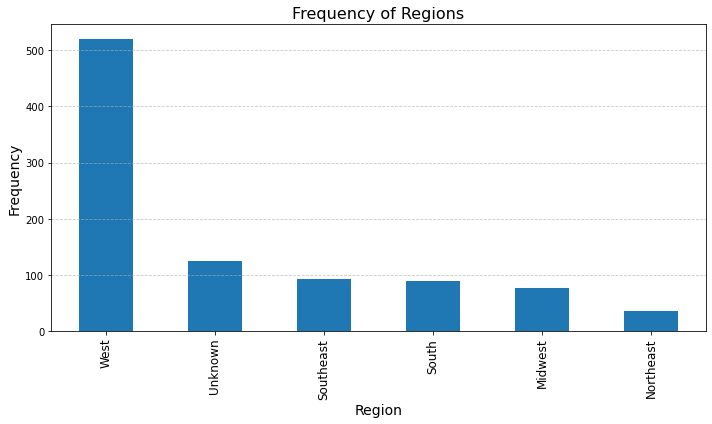

In [ ]:
region_counts = df_active['region'].value_counts()

plt.figure(figsize=(10, 6))
region_counts.plot(kind='bar')

plt.title('Frequency of Regions', fontsize=16)
plt.xlabel('Region', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=90, fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()

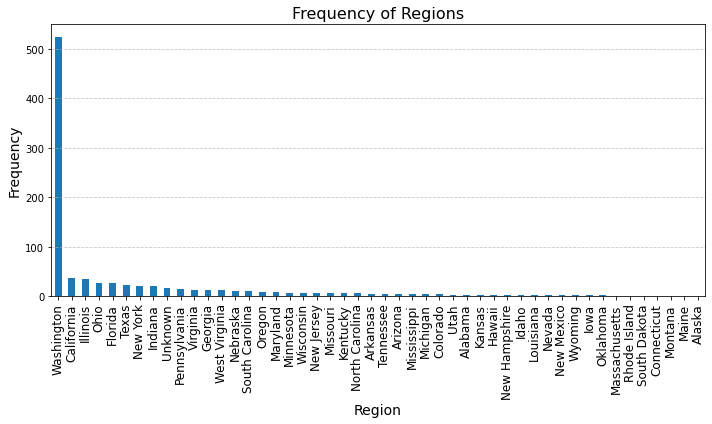

In [45]:
region_counts = df_active['state'].value_counts()

plt.figure(figsize=(10, 6))
region_counts.plot(kind='bar')

plt.title('Frequency of Regions', fontsize=16)
plt.xlabel('Region', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=90, fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()

In [46]:
len(region_counts)

48

In [47]:
def create_user_df(user_df, item, item_dict):
    userdf = pd.DataFrame()
    userdf = user_df[['user_id', 'ConversationId']].copy()
    
    other_columns = user_df.drop(columns=['user_id','ConversationId']).columns
    
    userdf[item] = user_df[other_columns].apply(lambda row: [col for col in other_columns if row[col] != 0], axis=1)
    userdf[item_dict] = user_df[other_columns].apply(lambda row: {col: row[col] for col in other_columns if row[col] != 0}, axis=1)
    return userdf

In [ ]:
# number of conversations in the data sample
df1['ConversationId'].nunique()

3429

In [ ]:
# number of interactions (requests + responses) in the data sample
len(df1['ConversationId'])

11173

In [51]:
conversation_counts = df1.groupby('ConversationId').size()
single_row_conversations = conversation_counts[conversation_counts == 1].count()
single_row_conversations

1380

# Educator Needs Identification

Detailed analysis of the types of educational contexts and instructional practices that K-12 math educators frequently inquire about. Use quantitative methods to analyze the frequency of various instructional practices mentioned in conversations, presenting this data through descriptive statistics and visualizations to highlight prevalent trends or gaps. 

In [53]:
conversation_profile = pd.DataFrame()

for edu in tqdm(edu_li):
    relevant_columns = list(set(rubrics_li + practice_li2 + context_li + assess_li + contentrigor_li + ["ConversationId", 'created_date']))

    filtered_df = df1[df1[edu] == 1]
    df_filtered= filtered_df[relevant_columns]

    tempuser_all = df_filtered.groupby(["ConversationId"]).agg({**{col: 'max' for col in df_filtered.columns if col not in ['ConversationId','created_date']}, 'created_date': 'min'}).reset_index()
    
    tempuser_all['EduLevel'] = edu
    conversation_profile = pd.concat([conversation_profile, tempuser_all], ignore_index=True)


100%|██████████| 6/6 [00:00<00:00, 99.23it/s]


In [54]:
conversation_profile["No Context"] = (conversation_profile[context_li] == 0).all(axis=1).astype(int)

In [55]:
conversation_profile["No Practice"] = (conversation_profile[practice_li] == 0).all(axis=1).astype(int)

In [56]:
conversation_profile['created_date'] = pd.to_datetime(conversation_profile['created_date'])

conversation_profile['YearMonth'] = conversation_profile['created_date'].dt.to_period('M')

context_summary = conversation_profile.groupby('YearMonth').apply(
    lambda x: (x['No Context'] == 1).mean() * 100
).reset_index(name='Percentage_No_Context_1')

context_summary

,YearMonth,Percentage_No_Context_1
0,2024-05,83.333333
1,2024-06,77.777778
2,2024-07,88.888889
3,2024-08,61.290323
4,2024-09,77.272727
5,2024-10,84.236453
6,2024-11,78.237410
7,2024-12,73.547718
8,2025-01,60.626030
9,2025-02,44.807692


In [57]:
context_summary = conversation_profile.groupby('YearMonth').apply(
    lambda x: (x['No Practice'] == 1).mean() * 100
).reset_index(name='Percentage_No_Practice_1')

context_summary

,YearMonth,Percentage_No_Practice_1
0,2024-05,0.000000
1,2024-06,0.000000
2,2024-07,44.444444
3,2024-08,3.225806
4,2024-09,27.272727
5,2024-10,89.655172
6,2024-11,7.913669
7,2024-12,12.966805
8,2025-01,3.624382
9,2025-02,1.346154


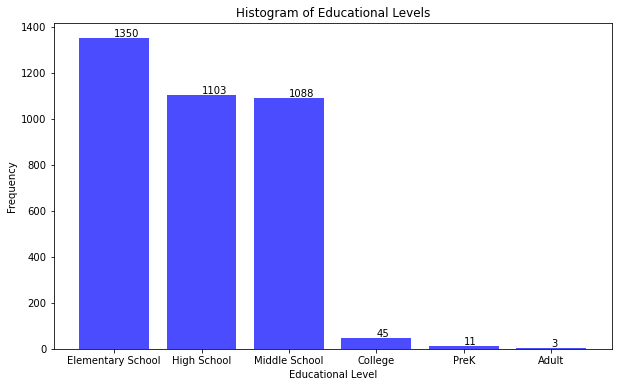

In [58]:
levels_counts = conversation_profile["EduLevel"].value_counts().to_dict()

plt.figure(figsize=(10, 6))
bars = plt.bar(levels_counts.keys(), levels_counts.values(), color='blue', alpha=0.7)
plt.title('Histogram of Educational Levels')
plt.xlabel('Educational Level')
plt.ylabel('Frequency')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 1), va='bottom')  # va: vertical alignment

plt.show()

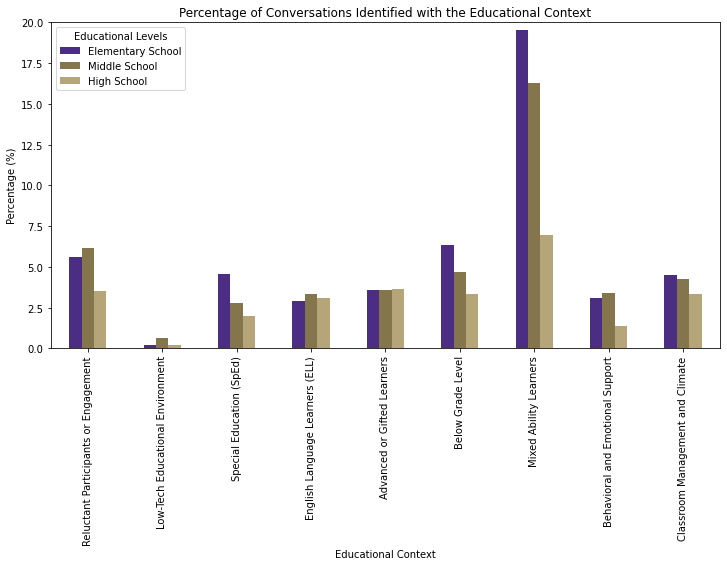

In [61]:
edu_order = ["Elementary School", "Middle School", "High School"]

edu = set(edu_order) 
filtered_df = conversation_profile[conversation_profile['EduLevel'].isin(edu)]

percentages = filtered_df.groupby("EduLevel")[context_li].apply(lambda x: (x == 1).sum() / len(x) * 100)

percentages = percentages.loc[edu_order]

ax = percentages.T.plot(kind="bar", figsize=(12, 6), color=uw_colors[0:3])
plt.xlabel("Educational Context")
plt.ylabel("Percentage (%)")
plt.title("Percentage of Conversations Identified with the Educational Context")
plt.ylim(0, 20)
plt.xticks(rotation=90)
plt.legend(title="Educational Levels", loc="upper left")
plt.show()

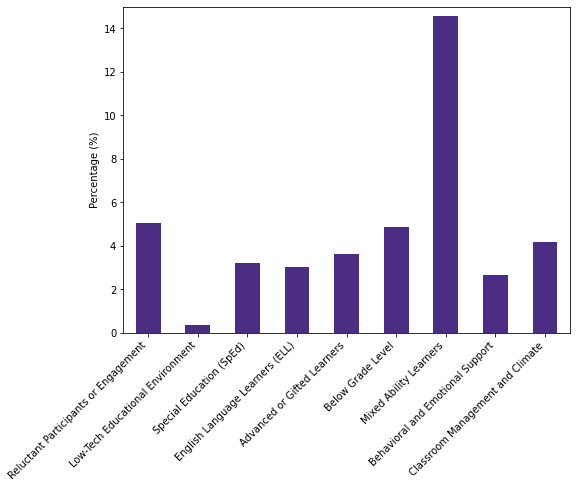

In [ ]:
# How educators describe their educational settings? 
filtered_df = conversation_profile
percentages = filtered_df[context_li].apply(lambda x: (x == 1).sum() / len(x) * 100)

ax = percentages.T.plot(kind="bar", figsize=(8, 6), color=uw_colors[0])
plt.ylabel("Percentage (%)")
plt.title("")
plt.ylim(0,15)
plt.xticks(rotation=45, ha="right")
plt.show()

In [ ]:
# What educational settings math educators situated in ?
percentages

Reluctant Participants or Engagement     5.055556
Low-Tech Educational Environment         0.361111
Special Education (SpEd)                 3.194444
English Language Learners (ELL)          3.027778
Advanced or Gifted Learners              3.638889
Below Grade Level                        4.888889
Mixed Ability Learners                  14.583333
Behavioral and Emotional Support         2.638889
Classroom Management and Climate         4.166667
dtype: float64

In [ ]:
# percentage of conversation contains identifiable description of educational settings
percentages.sum()

41.55555555555555

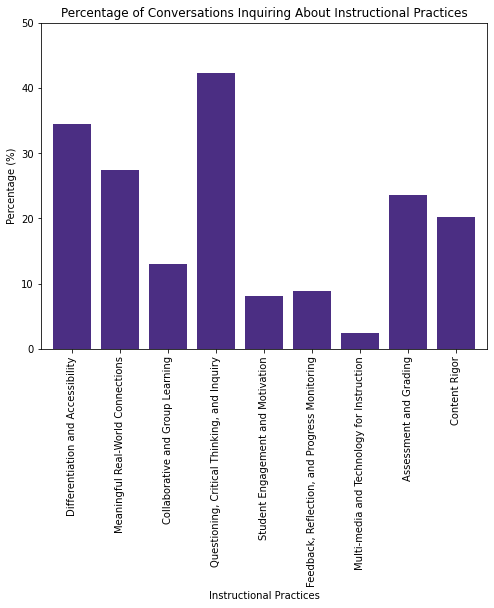

In [ ]:
# Distribution of pedagogy aspects among conversations
filtered_df = conversation_profile

percentages = filtered_df[rubrics_li].apply(lambda x: (x == 1).sum() / len(x) * 100)

ax = percentages.T.plot(kind="bar", figsize=(8, 6), color=uw_colors[0], width=0.8)  # Horizontal bars
plt.xlabel("Instructional Practices")
plt.ylabel("Percentage (%)")
plt.title("Percentage of Conversations Inquiring About Instructional Practices")
plt.ylim(0, 50) 
plt.show()

In [ ]:
# What pedagogical aspects that math educators are attend to?
percentages

Differentiation and Accessibility                34.444444
Meaningful Real-World Connections                27.444444
Collaborative and Group Learning                 13.055556
Questioning, Critical Thinking, and Inquiry      42.250000
Student Engagement and Motivation                 8.138889
Feedback, Reflection, and Progress Monitoring     8.861111
Multi-media and Technology for Instruction        2.361111
Assessment and Grading                           23.555556
Content Rigor                                    20.277778
dtype: float64

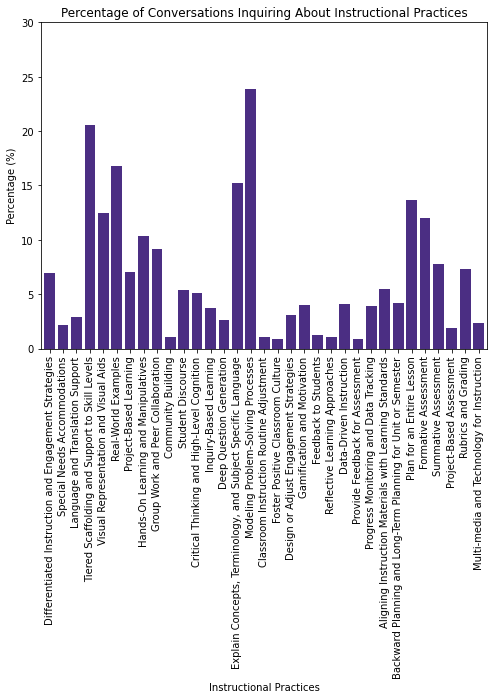

In [ ]:
# distribution of instructional practices
filtered_df = conversation_profile

percentages = filtered_df[practice_li].apply(lambda x: (x == 1).sum() / len(x) * 100)

ax = percentages.T.plot(kind="bar", figsize=(8, 6), color=uw_colors[0], width=0.8)  # Horizontal bars
plt.xlabel("Instructional Practices")
plt.ylabel("Percentage (%)")
plt.title("Percentage of Conversations Inquiring About Instructional Practices")
plt.ylim(0, 30) 
plt.show()

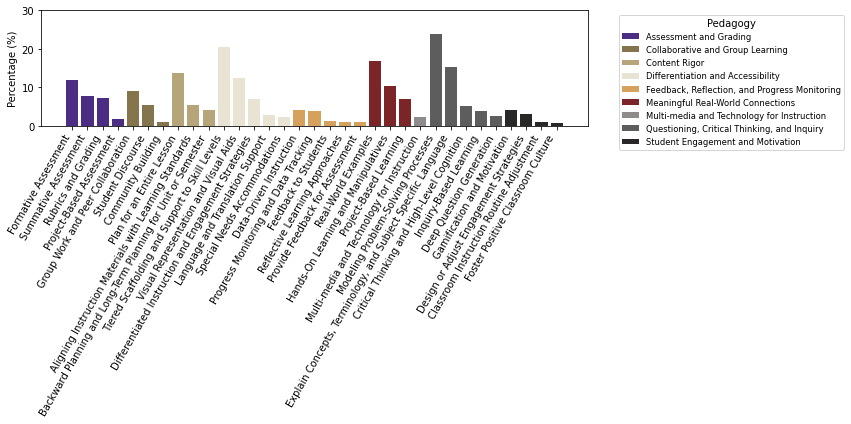

In [ ]:
# Distribution of intructional pratices within pedagogical aspects

practice_to_rubrics = {
    'Differentiation and Accessibility': p1,
    'Meaningful Real-World Connections': p2,
    'Collaborative and Group Learning': p3,
    'Questioning, Critical Thinking, and Inquiry': p4,
    'Student Engagement and Motivation': p5,
    'Feedback, Reflection, and Progress Monitoring': p6,
    'Assessment and Grading': assess_li,
    'Content Rigor': contentrigor_li,
    'Multi-media and Technology for Instruction': ['Multi-media and Technology for Instruction']
}

practice_to_rubric_flat = {practice: rubric for rubric, practices in practice_to_rubrics.items() for practice in practices}

# Compute percentages for each practice
percentages = filtered_df[list(practice_to_rubric_flat.keys())].apply(lambda x: (x == 1).sum() / len(x) * 100)

# Create a DataFrame mapping practices to rubrics
rubric_df = pd.DataFrame({'Practice': percentages.index, 'Percentage': percentages.values})
rubric_df['Rubric'] = rubric_df['Practice'].map(practice_to_rubric_flat)

# Group by rubrics and sort within each rubric
rubric_df = rubric_df.sort_values(by=['Rubric', 'Percentage'], ascending=[True, False])

# Plot grouped bars
plt.figure(figsize=(12, 6))
rubric_labels = rubric_df['Rubric'].unique()
colors = plt.cm.get_cmap("tab10", len(rubric_labels))  # Generate distinct colors

for i, (rubric, group) in enumerate(rubric_df.groupby('Rubric')):
    plt.bar(group['Practice'], group['Percentage'], label=rubric, color=uw_colors[i % len(uw_colors)])

plt.ylabel("Percentage (%)")
#plt.title("Percentage of Conversations Inquiring About Instructional Practices")
plt.xticks(rotation=60, ha="right")
plt.legend(title="Pedagogy", bbox_to_anchor=(1.05, 1), loc="upper left", fontsize="small")
plt.ylim(0, 30)  # Adjust y-axis range
plt.tight_layout()
plt.show()


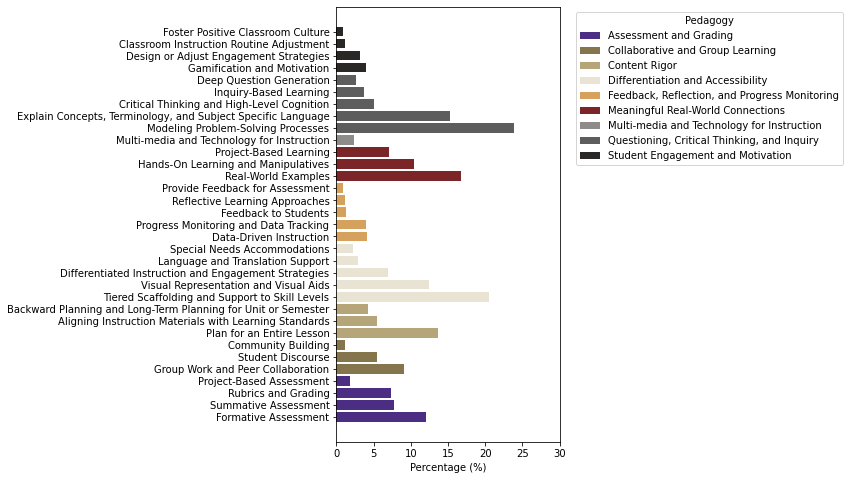

In [ ]:
# Distribution of intructional pratices within pedagogical aspects
practice_to_rubrics = {
    'Differentiation and Accessibility': p1,
    'Meaningful Real-World Connections': p2,
    'Collaborative and Group Learning': p3,
    'Questioning, Critical Thinking, and Inquiry': p4,
    'Student Engagement and Motivation': p5,
    'Feedback, Reflection, and Progress Monitoring': p6,
    'Assessment and Grading': assess_li,
    'Content Rigor': contentrigor_li,
    'Multi-media and Technology for Instruction': ['Multi-media and Technology for Instruction']
}
# Flatten the mapping
practice_to_rubric_flat = {practice: rubric for rubric, practices in practice_to_rubrics.items() for practice in practices}

# Compute percentages for each practice
percentages = filtered_df[list(practice_to_rubric_flat.keys())].apply(lambda x: (x == 1).sum() / len(x) * 100)

# Create a DataFrame mapping practices to rubrics
rubric_df = pd.DataFrame({'Practice': percentages.index, 'Percentage': percentages.values})
rubric_df['Rubric'] = rubric_df['Practice'].map(practice_to_rubric_flat)

# Group by rubrics and sort within each rubric
rubric_df = rubric_df.sort_values(by=['Rubric', 'Percentage'], ascending=[True, False])

# Plot horizontal bars
plt.figure(figsize=(4, 8))  # Adjusted for better display in horizontal format
rubric_labels = rubric_df['Rubric'].unique()
colors = plt.cm.get_cmap("tab10", len(rubric_labels))  # Generate distinct colors

# Create a color map indexed by rubric
color_map = {rubric: colors(i) for i, rubric in enumerate(rubric_labels)}

# Horizontal bar plot

for i, (rubric, group) in enumerate(rubric_df.groupby('Rubric')):
    plt.barh(group['Practice'], group['Percentage'], label=rubric, color=uw_colors[i % len(uw_colors)])

plt.xlabel("Percentage (%)")
plt.yticks(rotation=0)  # Adjust rotation if necessary
plt.legend(title="Pedagogy", bbox_to_anchor=(1.05, 1), loc="upper left")


plt.xlim(0, 30)  # Adjust x-axis range based on your data's scale
plt.tight_layout()

# Save or show plot
#plt.savefig('/path/to/your/directory/practice_rubrics_horizontal.png')
plt.show()



In [ ]:
percentages

Differentiated Instruction and Engagement Strategies              6.916667
Special Needs Accommodations                                      2.166667
Language and Translation Support                                  2.916667
Tiered Scaffolding and Support to Skill Levels                   20.555556
Visual Representation and Visual Aids                            12.472222
Real-World Examples                                              16.805556
Project-Based Learning                                            7.000000
Hands-On Learning and Manipulatives                              10.388889
Group Work and Peer Collaboration                                 9.138889
Community Building                                                1.083333
Student Discourse                                                 5.388889
Critical Thinking and High-Level Cognition                        5.111111
Inquiry-Based Learning                                            3.722222
Deep Question Generation 

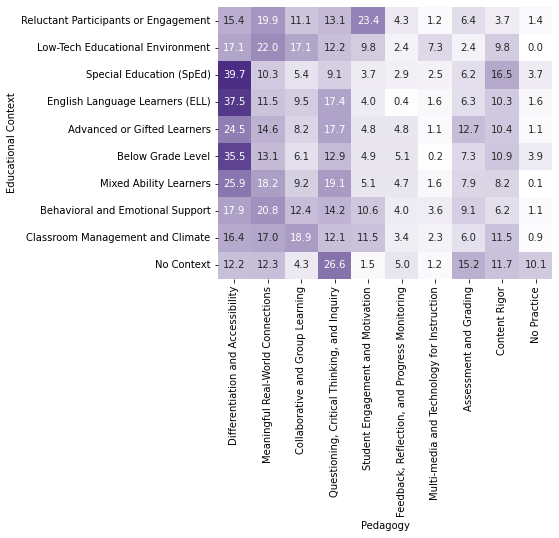

In [ ]:
# correlation between revealed educational context and pedagogical aspects
relevant_columns = rubrics_li + context_li + ["EduLevel", 'No Context', 'No Practice']
df_filtered = filtered_df[relevant_columns]

df_subset = df_filtered.drop(columns=["EduLevel"])

heatmap_data = df_subset[context_li+['No Context']].T @ df_subset[rubrics_li+['No Practice']]
heatmap_data = heatmap_data.div(heatmap_data.sum(axis=1), axis=0) * 100 

heatmap_data = heatmap_data.fillna(0)
custom_cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", ["white", uw_colors[0]])

plt.figure(figsize=(6, 5))
sns.heatmap(heatmap_data, annot=True, cmap=custom_cmap, fmt=".1f", cbar=False)  # Remove color bar
plt.xlabel("Pedagogy")
plt.ylabel("Educational Context")
plt.show()

In [ ]:
heatmap_data

,Differentiation and Accessibility,Meaningful Real-World Connections,Collaborative and Group Learning,"Questioning, Critical Thinking, and Inquiry",Student Engagement and Motivation,"Feedback, Reflection, and Progress Monitoring",Multi-media and Technology for Instruction,Assessment and Grading,Content Rigor,No Practice
Reluctant Participants or Engagement,15.400411,19.917864,11.088296,13.141684,23.408624,4.312115,1.232033,6.365503,3.696099,1.437372
Low-Tech Educational Environment,17.073171,21.951220,17.073171,12.195122,9.756098,2.439024,7.317073,2.439024,9.756098,0.000000
Special Education (SpEd),39.669421,10.330579,5.371901,9.090909,3.719008,2.892562,2.479339,6.198347,16.528926,3.719008
English Language Learners (ELL),37.549407,11.462451,9.486166,17.391304,3.952569,0.395257,1.581028,6.324111,10.276680,1.581028
Advanced or Gifted Learners,24.507042,14.647887,8.169014,17.746479,4.788732,4.788732,1.126761,12.676056,10.422535,1.126761
Below Grade Level,35.523114,13.138686,6.082725,12.895377,4.866180,5.109489,0.243309,7.299270,10.948905,3.892944
Mixed Ability Learners,25.933469,18.194162,9.232858,19.076714,5.091650,4.684318,1.561439,7.942974,8.214528,0.067889
Behavioral and Emotional Support,17.883212,20.802920,12.408759,14.233577,10.583942,4.014599,3.649635,9.124088,6.204380,1.094891
Classroom Management and Climate,16.382979,17.021277,18.936170,12.127660,11.489362,3.404255,2.340426,5.957447,11.489362,0.851064
No Context,12.212343,12.264644,4.262552,26.569038,1.464435,4.994770,1.176778,15.193515,11.715481,10.146444


In [ ]:
# Merge evaluation results 
df1 = pd.merge(df1, dfr, on = 'id', how = "left")

In [ ]:
df_filtered = df1[(~df1['Response Category'].isna()) & (df1['Response Category'] != "None")]
conversation_means = df_filtered.groupby("ConversationId")[
    ["Response Accuracy", "Response Relevance", "Response Usefulness"]
].mean().reset_index()


conversation_profile = conversation_profile.merge(conversation_means, on="ConversationId", how="left")

conversation_mins = df_filtered.groupby("ConversationId")[
    ["Response Accuracy", "Response Relevance", "Response Usefulness"]
].min().reset_index()
conversation_mins.columns = ["ConversationId", "Response Accuracy_min", "Response Relevance_min", "Response Usefulness_min"]
conversation_profile = conversation_profile.merge(conversation_mins, on="ConversationId", how="left")
conversation_maxs = df_filtered.groupby("ConversationId")[
    ["Response Accuracy", "Response Relevance", "Response Usefulness"]
].max().reset_index()
conversation_maxs.columns = ["ConversationId", "Response Accuracy_max", "Response Relevance_max", "Response Usefulness_max"]
conversation_profile = conversation_profile.merge(conversation_maxs, on="ConversationId", how="left")

In [ ]:
# Compare evaluation measures with and without context or practice
avg_metrics = conversation_profile.groupby(['No Practice', 'No Context'])[['Response Accuracy', 'Response Usefulness', 'Response Relevance']].mean()

plt.figure(figsize=(8, 5))
avg_metrics.plot(kind='bar', figsize=(10, 6), legend=True)
plt.title("Average Response Evaluation Metrics by No Context")
plt.ylabel("Average Score")
plt.ylim(2, 3)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
for context in context_li:
    conversation_profile['temp'] = 2  # Default case (No Context == 0 & Context == 0)

# Assign 0 where No Context is 1
    conversation_profile.loc[conversation_profile['No Context'] == 1, 'temp'] = 0

# Assign 1 where context is 1
    conversation_profile.loc[conversation_profile[context] == 1, 'temp'] = 1

# Assign 2 where No Context == 0 & context == 0 (already default but ensuring correctness)
    conversation_profile.loc[(conversation_profile['No Context'] == 0) & (conversation_profile[context] == 0), 'temp'] = 2
    for practice in rubrics_li:
        avg_metrics =  conversation_profile.groupby(["temp", practice])[['Response Accuracy', 'Response Usefulness', 'Response Relevance']].mean()

        plt.figure(figsize=(8, 5))
        avg_metrics.plot(kind='bar', figsize=(10, 6), legend=True)
        plt.title(f"Average Response Evaluation Metrics \n {context} for {practice}")
        plt.ylabel("Average Score")
        plt.ylim(2, 3)
        plt.xticks(rotation=0)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()

In [ ]:
avg_metrics = conversation_profile.groupby(['No Practice', 'No Context'])[['Response Accuracy_min', 'Response Usefulness_min', 'Response Relevance_min']].mean()

plt.figure(figsize=(8, 5))
avg_metrics.plot(kind='bar', figsize=(10, 6), legend=True)
plt.title("Average Response Evaluation Metrics by No Context")
plt.ylabel("Average Score")
plt.ylim(2, 3)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# AI Response Analysis

* How well AI response adapt to educational context and instructional pratices?

In [ ]:
df1['context_sum'] = df1[context_li].sum(axis=1)
df1['practice_sum'] = df1[practice_li].sum(axis=1)

In [ ]:
df1_sorted = df1.sort_values(by=['ConversationId', 'created_date'])

def check_prior_context(group):
    group['cumsum_context'] = group['context_sum'].cumsum().shift(fill_value=0)
    group['No Context'] = (group['cumsum_context'] == 0).astype(int)
    return group

df1_sorted = df1_sorted.groupby('ConversationId', group_keys=False).apply(check_prior_context)

In [ ]:
def check_prior_practice(group):
    group['cumsum_practice'] = group['practice_sum'].cumsum().shift(fill_value=0)
    group['No Practice'] = (group['cumsum_practice'] == 0).astype(int)
    return group

df1_sorted = df1_sorted.groupby('ConversationId', group_keys=False).apply(check_prior_practice)

In [ ]:
(df1_sorted['No Practice'].sum(), df1_sorted['No Context'].sum())

(4578, 9199)

In [ ]:
df_filtered = df1_sorted[(~df1_sorted['Response Category'].isna()) & (df1_sorted['Response Category'] != "None")]
print(df_filtered['Response Accuracy'].mean(), 
      df_filtered['Response Usefulness'].mean(),
      df_filtered['Response Relevance'].mean())

2.8657240634005765 2.8424891930835736 2.7877341498559076


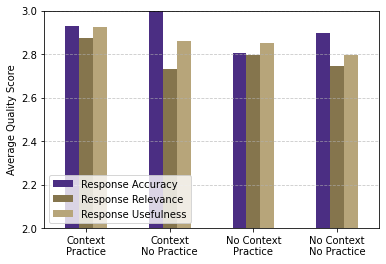

In [ ]:
df_filtered = df1_sorted[(~df1_sorted['Response Category'].isna()) & (df1_sorted['Response Category'] != "None")]

avg_metrics = df_filtered.groupby(['No Context', 'No Practice'])[['Response Accuracy', 'Response Relevance', 'Response Usefulness',]].mean()

fig, ax = plt.subplots(figsize=(6, 4))
avg_metrics.plot(kind='bar', ax=ax, legend=True, color=uw_colors[:len(avg_metrics)])

# Adding custom x-axis labels
custom_labels = ["Context\nPractice", "Context\nNo Practice", "No Context\nPractice", "No Context\nNo Practice"]
ax.set_xticklabels(custom_labels, rotation=0)
ax.set_xlabel("")  # Removes any previously set x-axis label
ax.set_title("") 
# Other plot customizations
plt.ylabel("Average Quality Score")
plt.ylim(2, 3)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(loc="lower left")
plt.show()

In [ ]:
group_counts = df_filtered.groupby(['No Context', 'No Practice']).size().reset_index(name='Count')
group_counts 

,No Context,No Practice,Count
0,0,0,1886
1,0,1,86
2,1,0,4662
3,1,1,4470


In [ ]:
avg_metrics

Response Accuracy  Response Usefulness  \
No Context No Practice                                           
0          0                     2.929480             2.923648   
           1                     3.000000             2.860465   
1          0                     2.805877             2.853067   
           1                     2.898658             2.796868   

                        Response Relevance  
No Context No Practice                      
0          0                      2.872747  
           1                      2.732558  
1          0                      2.795581  
           1                      2.744743

<Figure size 576x360 with 0 Axes>

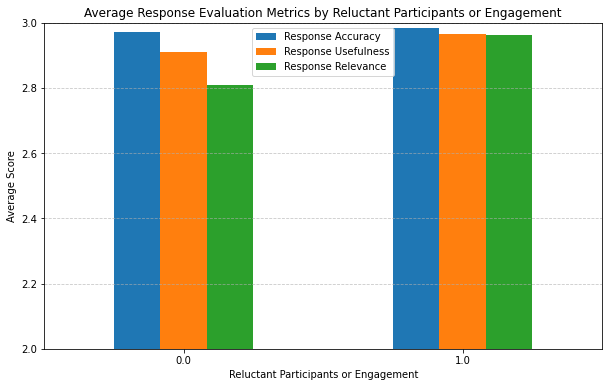

<Figure size 576x360 with 0 Axes>

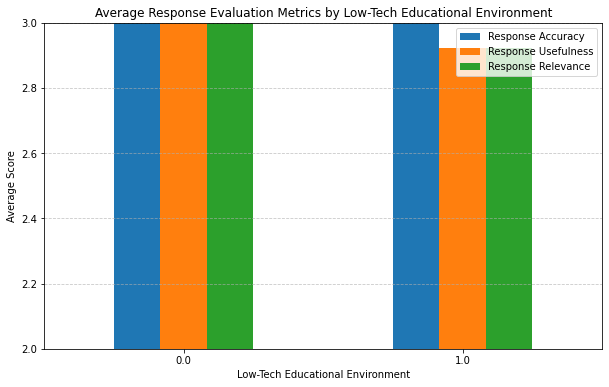

<Figure size 576x360 with 0 Axes>

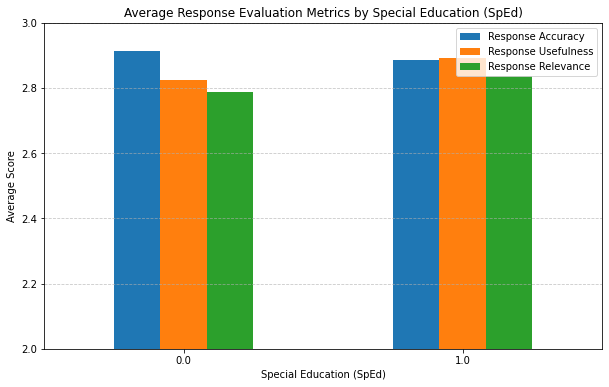

<Figure size 576x360 with 0 Axes>

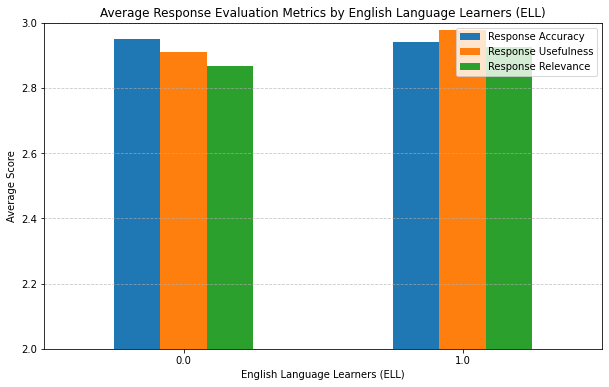

<Figure size 576x360 with 0 Axes>

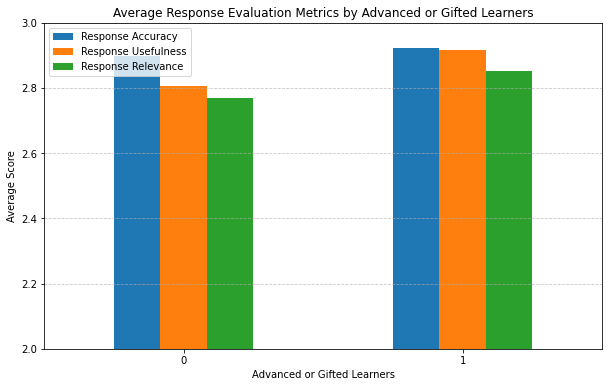

<Figure size 576x360 with 0 Axes>

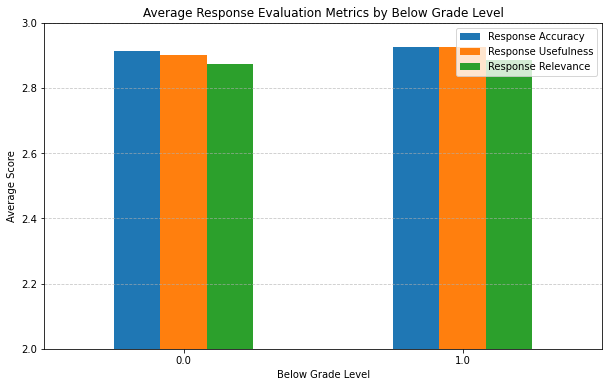

<Figure size 576x360 with 0 Axes>

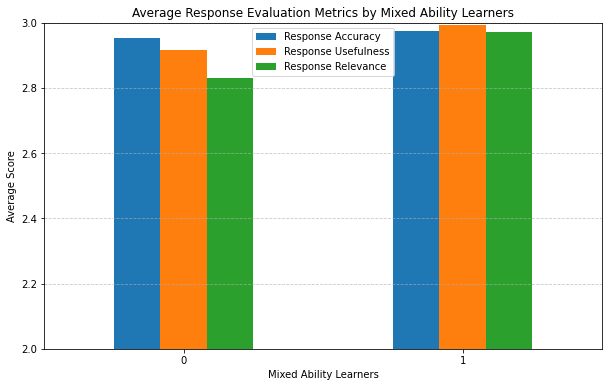

<Figure size 576x360 with 0 Axes>

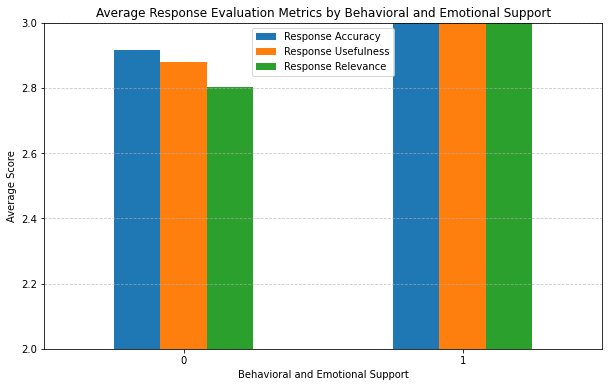

<Figure size 576x360 with 0 Axes>

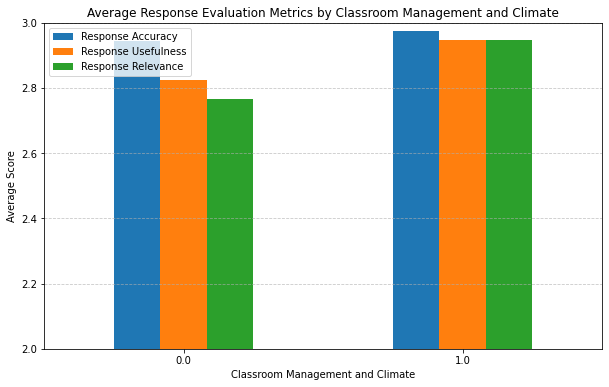

In [ ]:
for context in context_li: 
    filtered_conversation_ids = conversation_profile[conversation_profile[context] == 1]['ConversationId']

    df_filtered = df1_sorted[df1_sorted['ConversationId'].isin(filtered_conversation_ids)]

    df_filtered = df_filtered[(~df_filtered['Response Category'].isna()) & (df_filtered['Response Category'] != "None")]


    avg_metrics = df_filtered.groupby(context)[['Response Accuracy', 'Response Usefulness', 'Response Relevance']].mean()

    plt.figure(figsize=(8, 5))
    avg_metrics.plot(kind='bar', figsize=(10, 6), legend=True)
    plt.title(f"Average Response Evaluation Metrics by {context}")
    plt.ylabel("Average Score")
    plt.ylim(2, 3)
    plt.xticks(rotation=0)
    plt.grid(axis='y', linestyle='--', alpha=0.70)
    plt.show()

<Figure size 576x360 with 0 Axes>

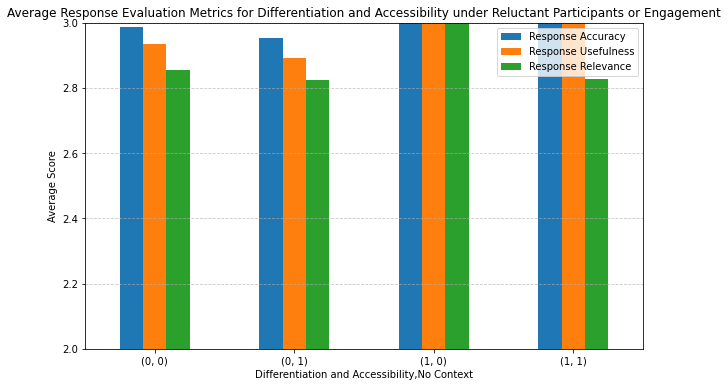

<Figure size 576x360 with 0 Axes>

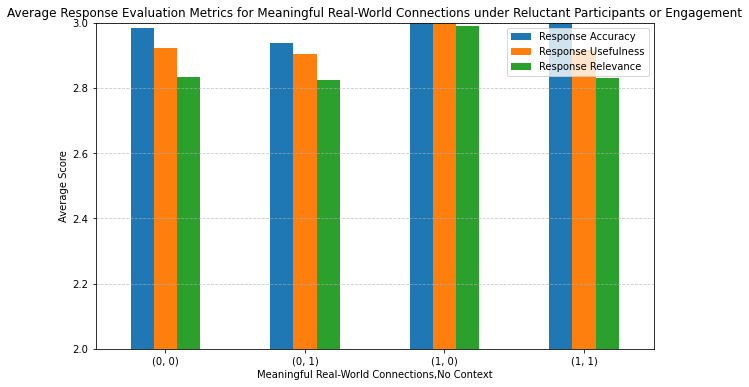

<Figure size 576x360 with 0 Axes>

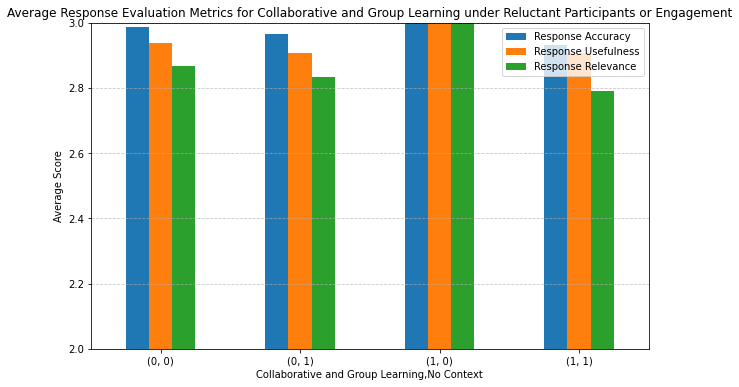

<Figure size 576x360 with 0 Axes>

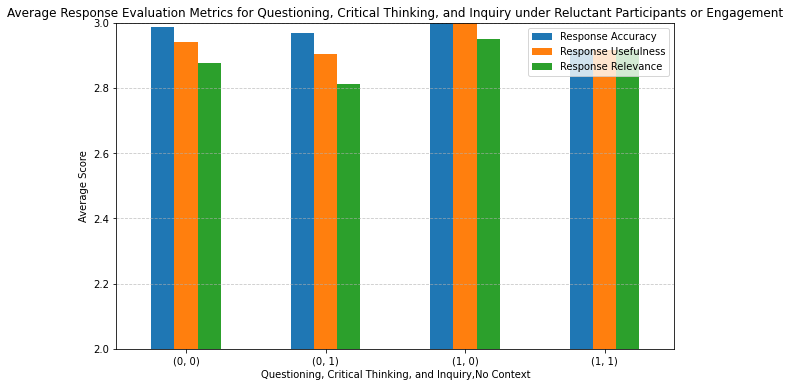

<Figure size 576x360 with 0 Axes>

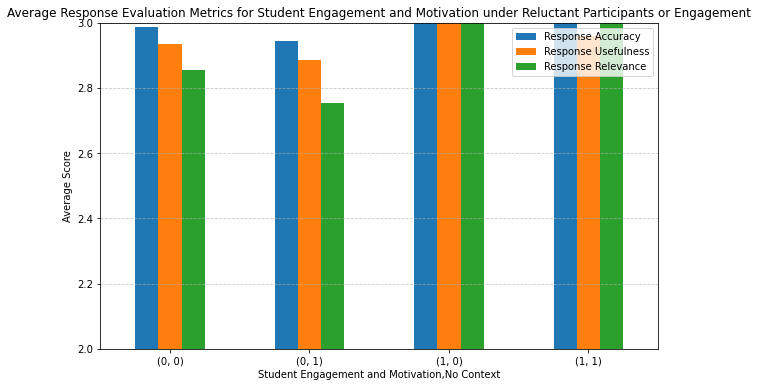

<Figure size 576x360 with 0 Axes>

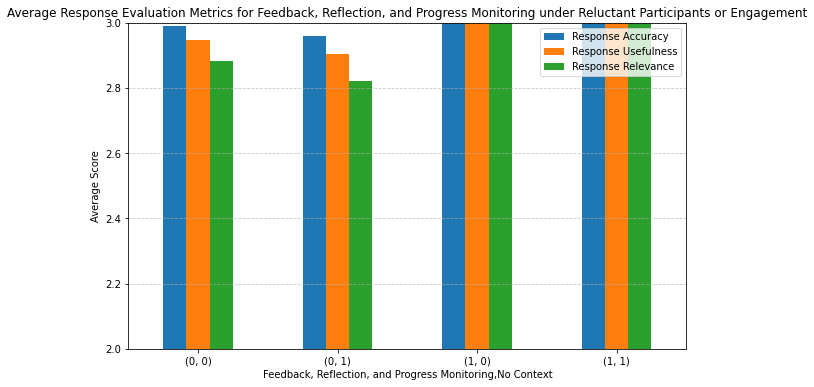

<Figure size 576x360 with 0 Axes>

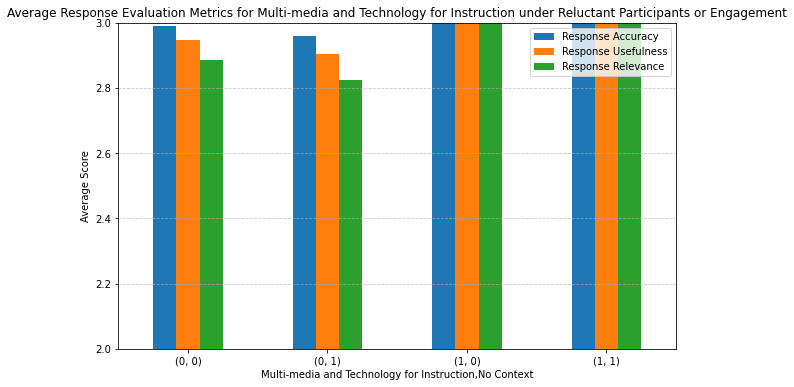

<Figure size 576x360 with 0 Axes>

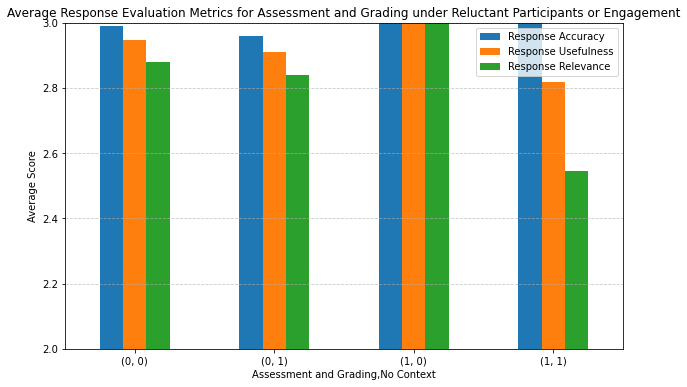

<Figure size 576x360 with 0 Axes>

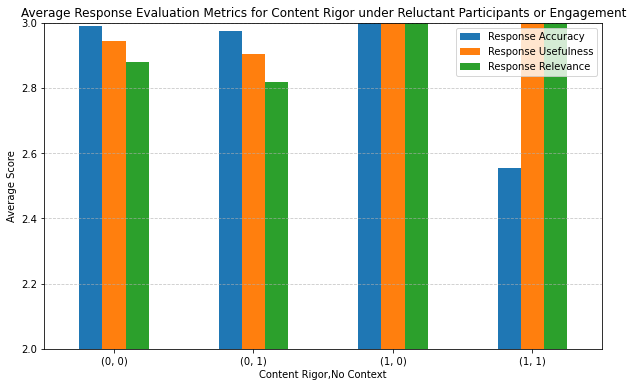

<Figure size 576x360 with 0 Axes>

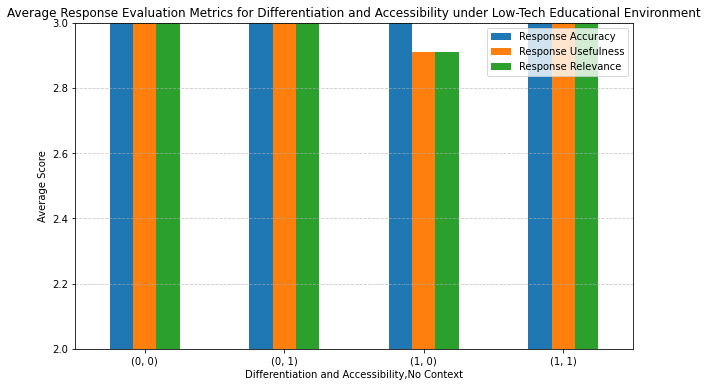

<Figure size 576x360 with 0 Axes>

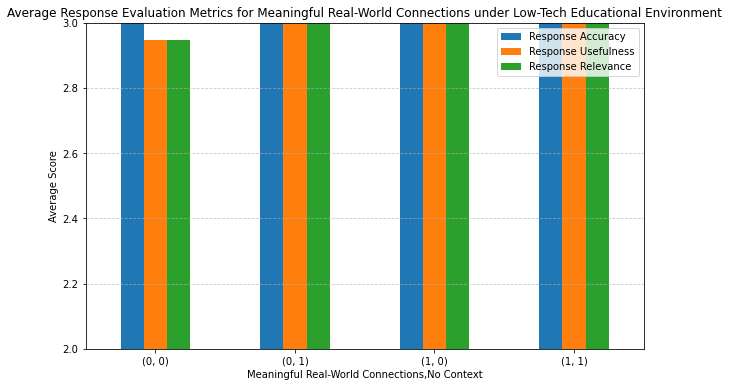

<Figure size 576x360 with 0 Axes>

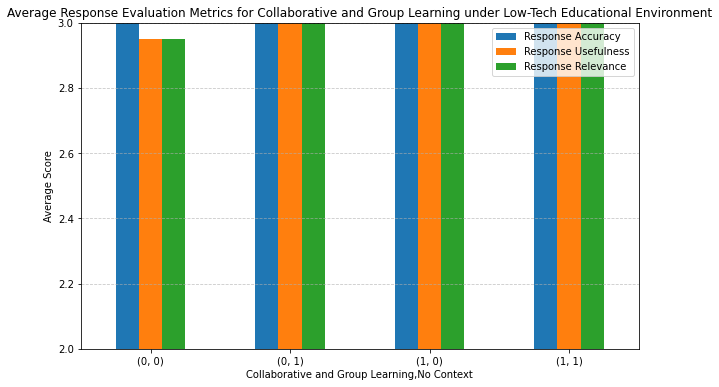

<Figure size 576x360 with 0 Axes>

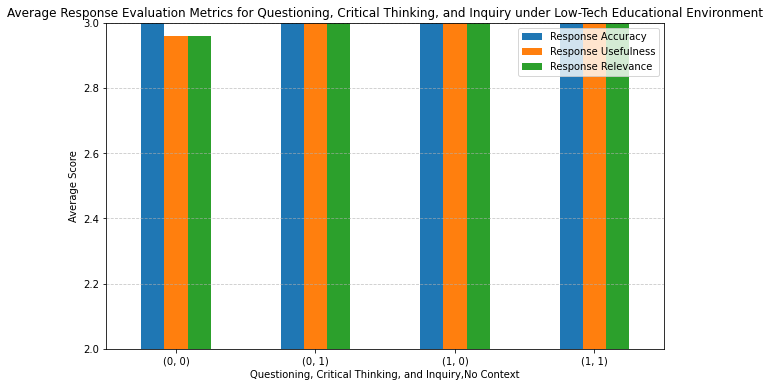

<Figure size 576x360 with 0 Axes>

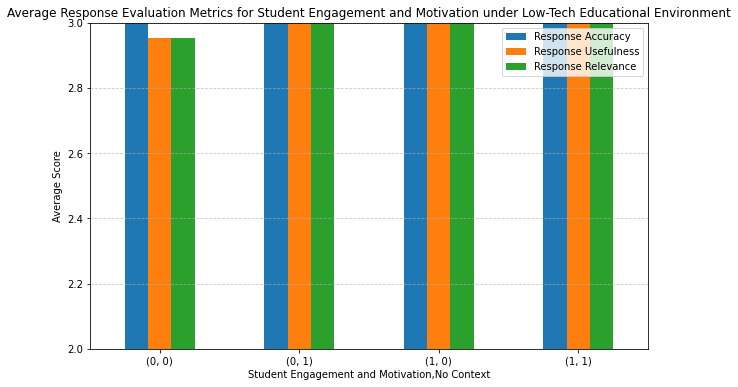

<Figure size 576x360 with 0 Axes>

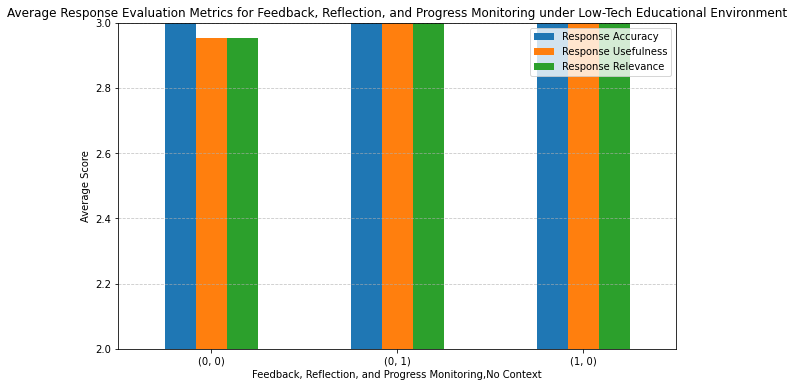

<Figure size 576x360 with 0 Axes>

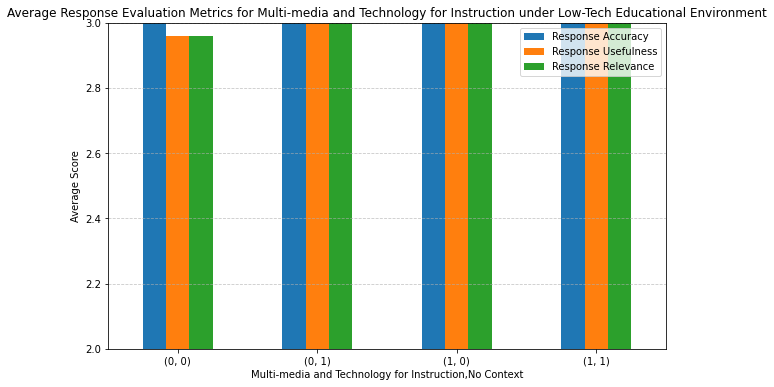

<Figure size 576x360 with 0 Axes>

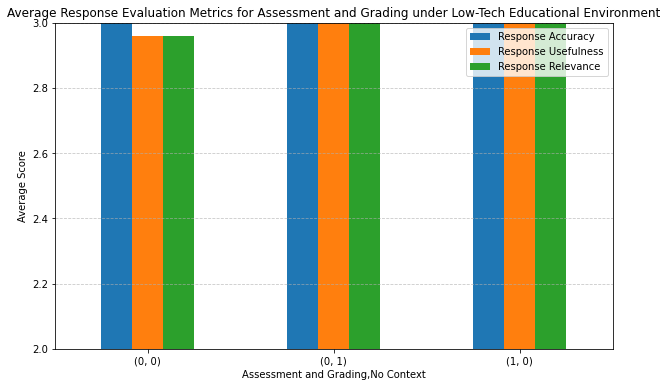

<Figure size 576x360 with 0 Axes>

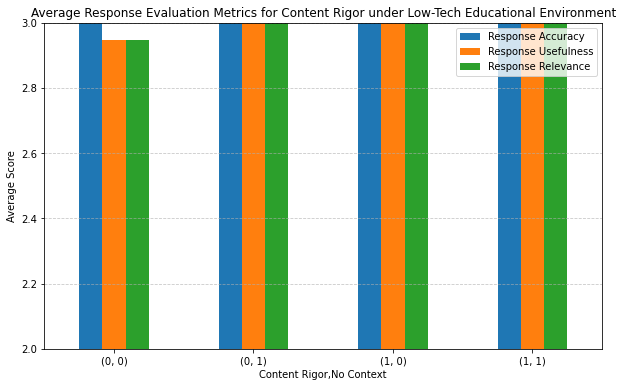

<Figure size 576x360 with 0 Axes>

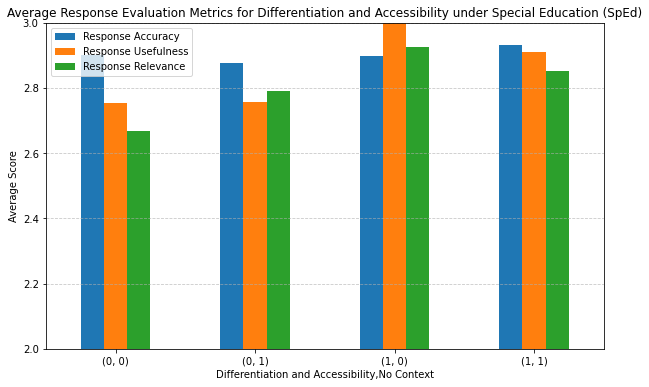

<Figure size 576x360 with 0 Axes>

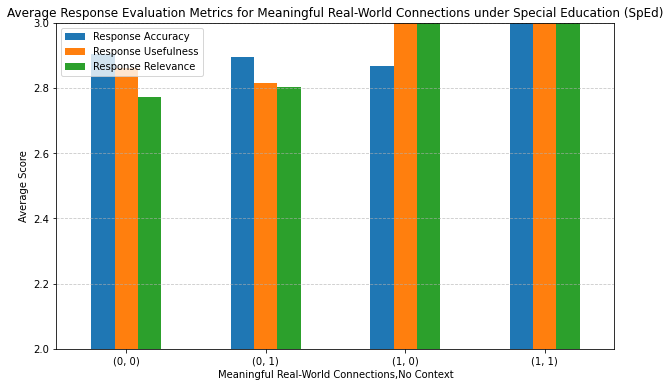

<Figure size 576x360 with 0 Axes>

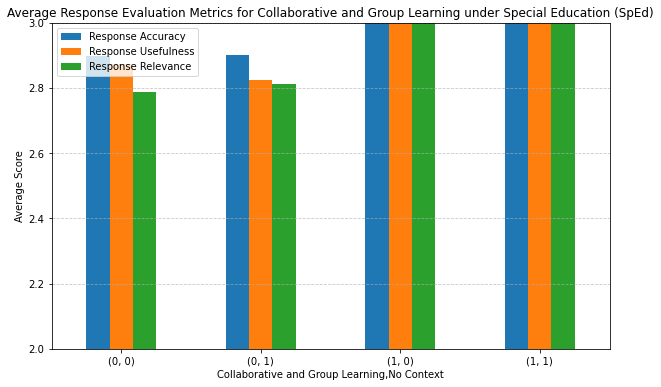

<Figure size 576x360 with 0 Axes>

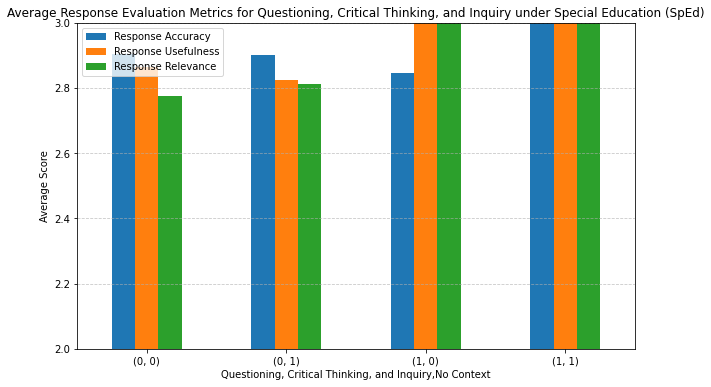

<Figure size 576x360 with 0 Axes>

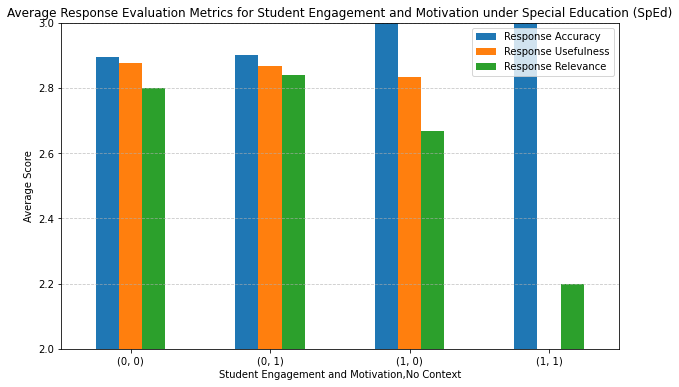

<Figure size 576x360 with 0 Axes>

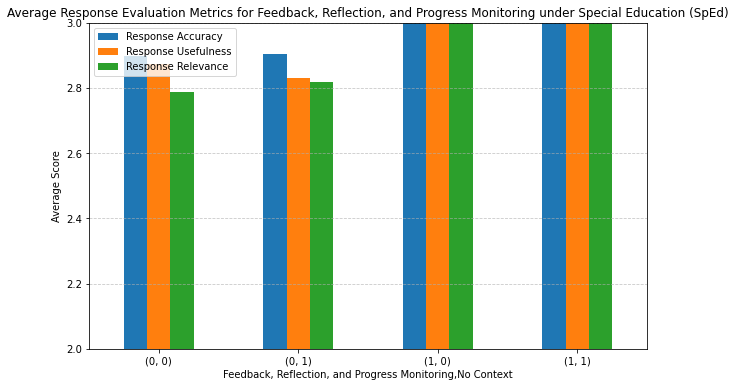

<Figure size 576x360 with 0 Axes>

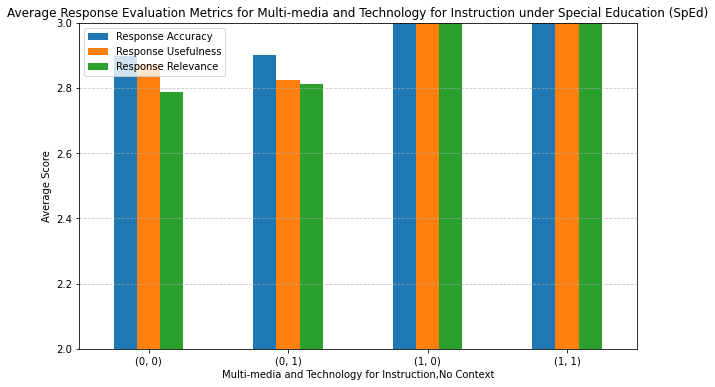

<Figure size 576x360 with 0 Axes>

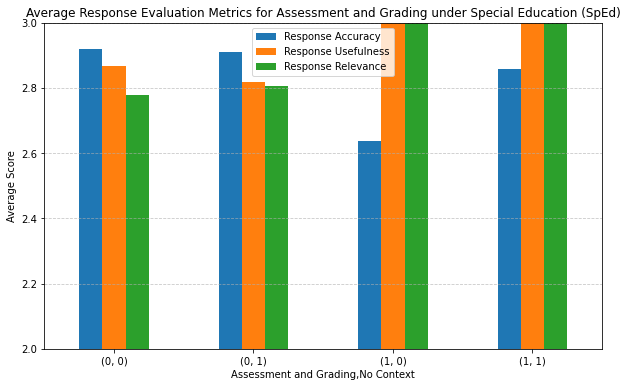

<Figure size 576x360 with 0 Axes>

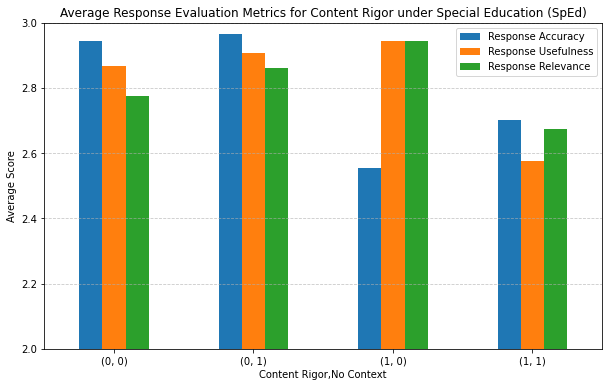

<Figure size 576x360 with 0 Axes>

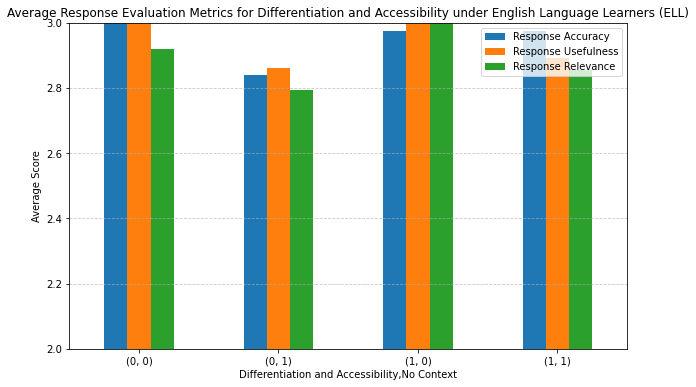

<Figure size 576x360 with 0 Axes>

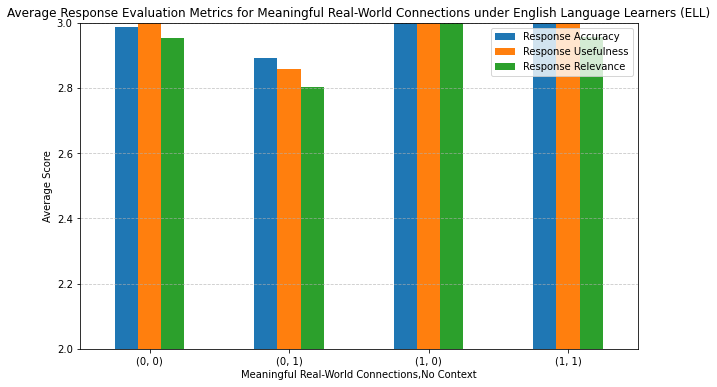

<Figure size 576x360 with 0 Axes>

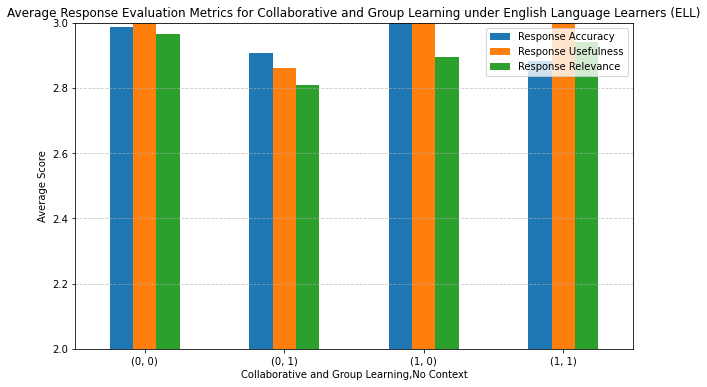

<Figure size 576x360 with 0 Axes>

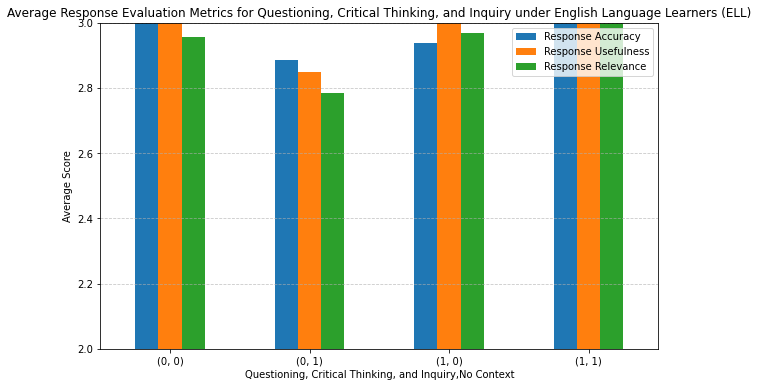

<Figure size 576x360 with 0 Axes>

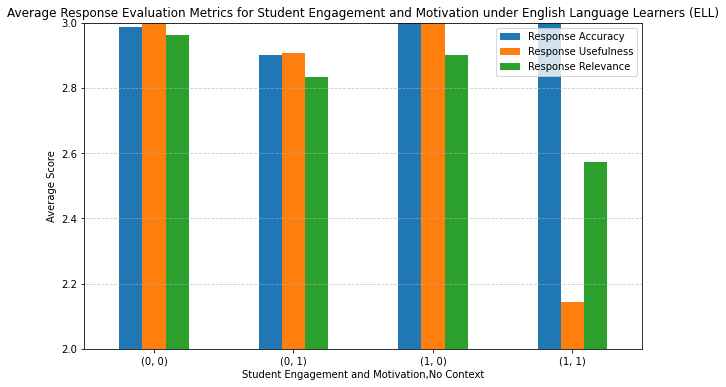

<Figure size 576x360 with 0 Axes>

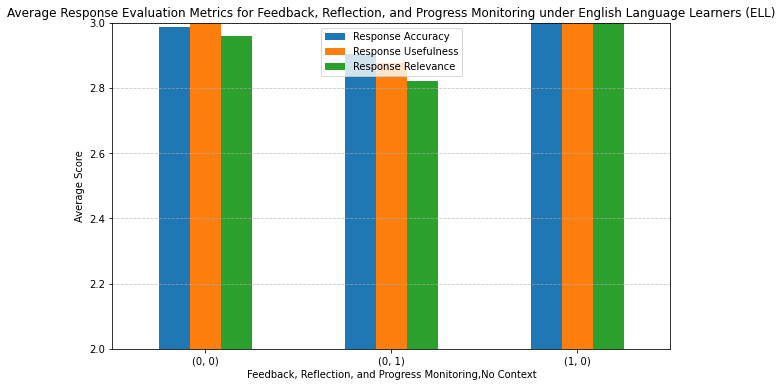

<Figure size 576x360 with 0 Axes>

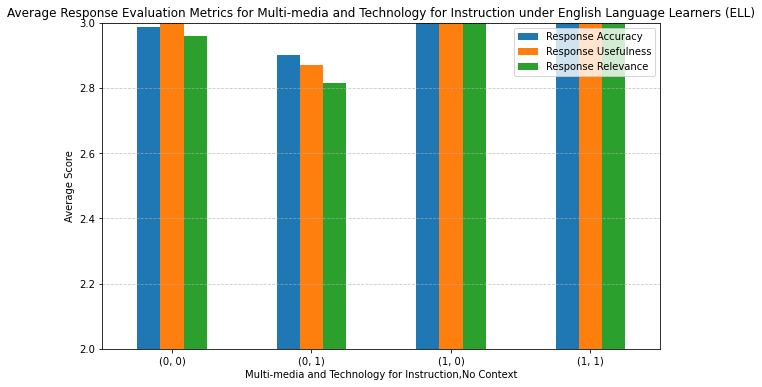

<Figure size 576x360 with 0 Axes>

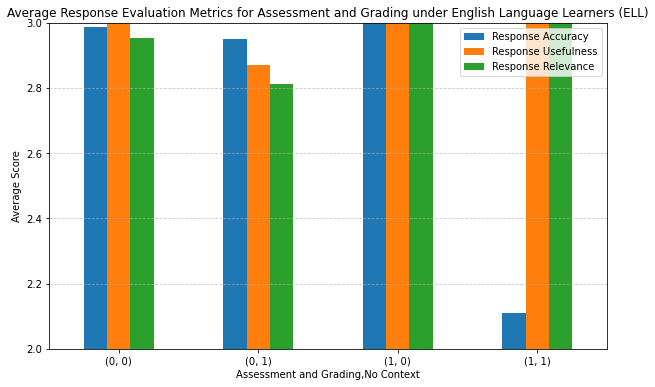

<Figure size 576x360 with 0 Axes>

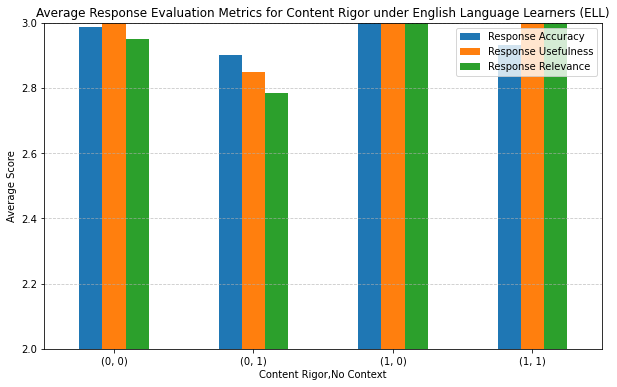

<Figure size 576x360 with 0 Axes>

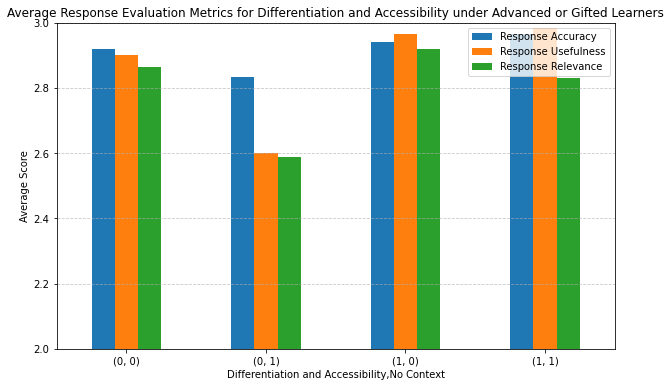

<Figure size 576x360 with 0 Axes>

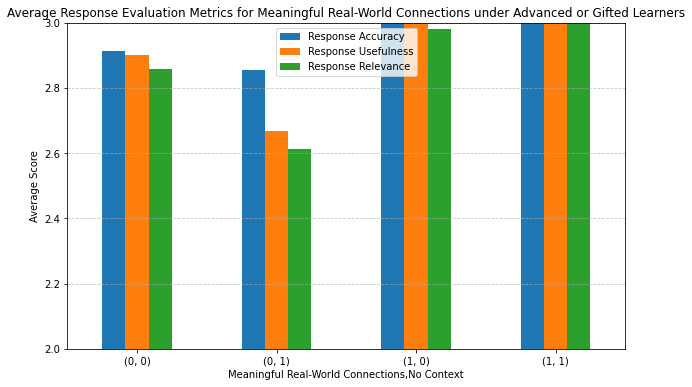

<Figure size 576x360 with 0 Axes>

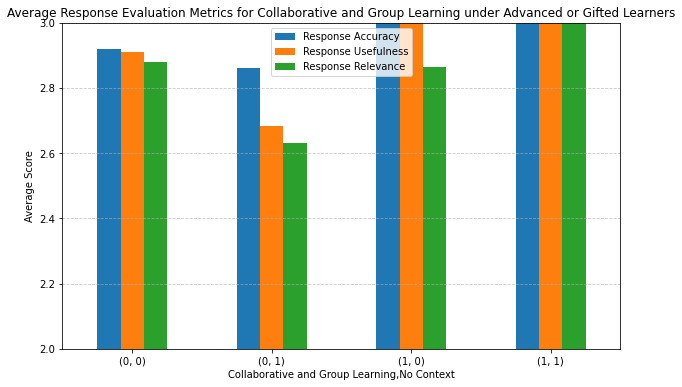

<Figure size 576x360 with 0 Axes>

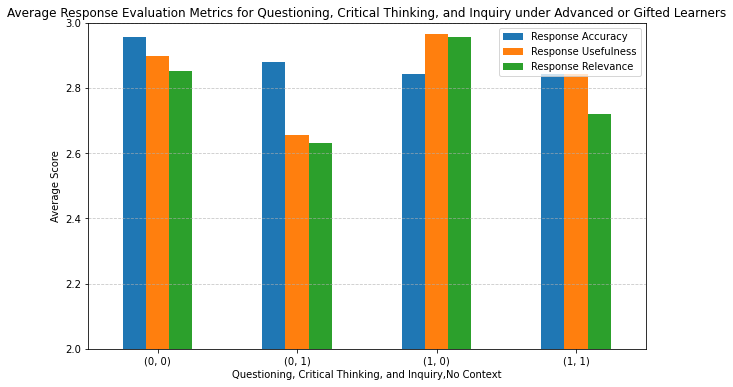

<Figure size 576x360 with 0 Axes>

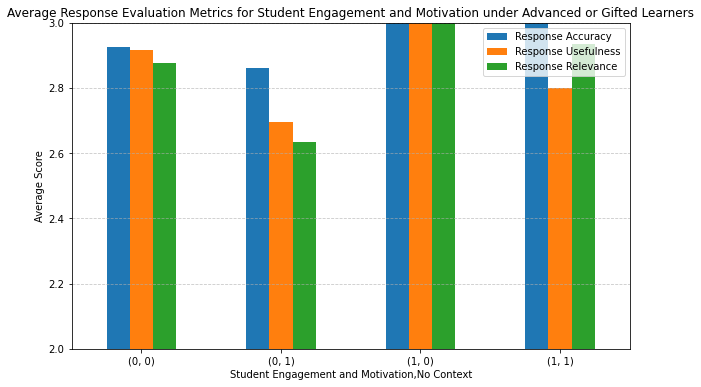

<Figure size 576x360 with 0 Axes>

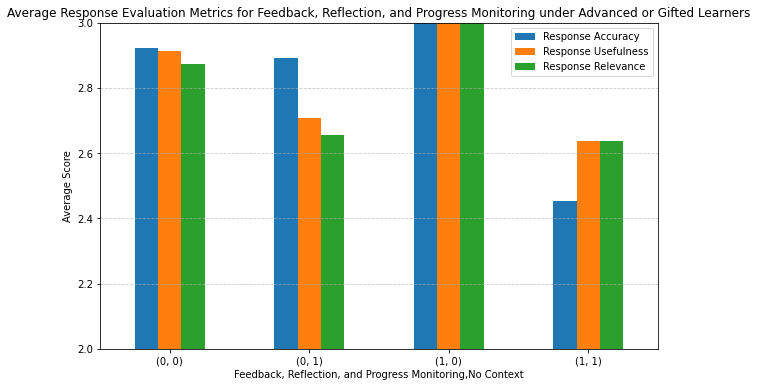

<Figure size 576x360 with 0 Axes>

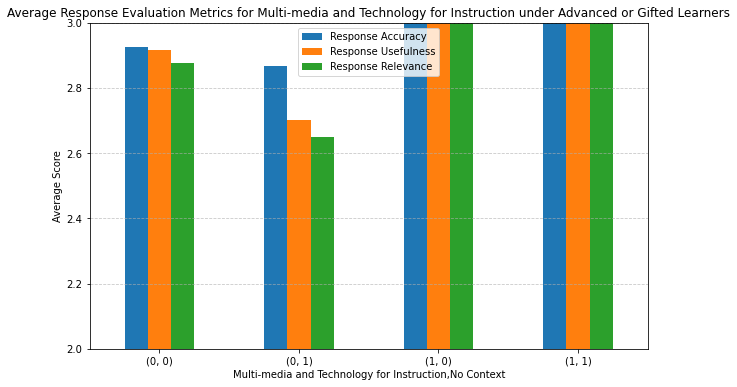

<Figure size 576x360 with 0 Axes>

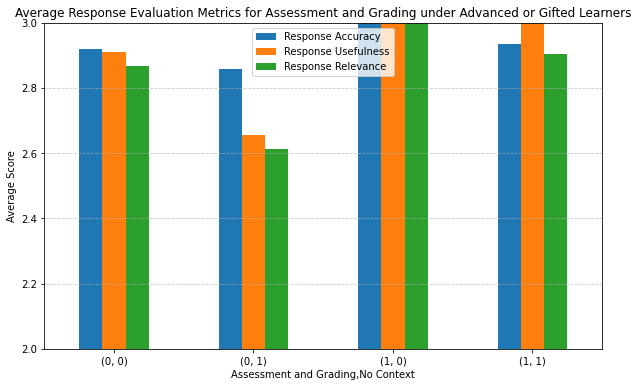

<Figure size 576x360 with 0 Axes>

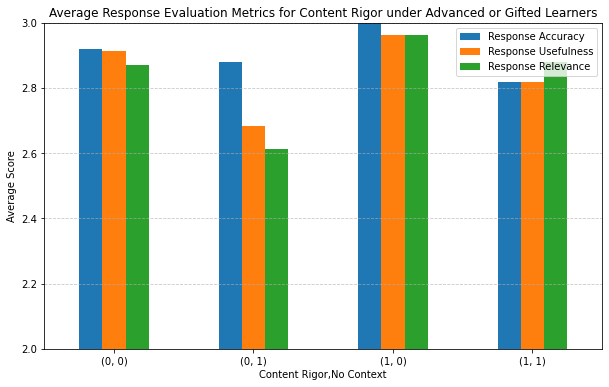

<Figure size 576x360 with 0 Axes>

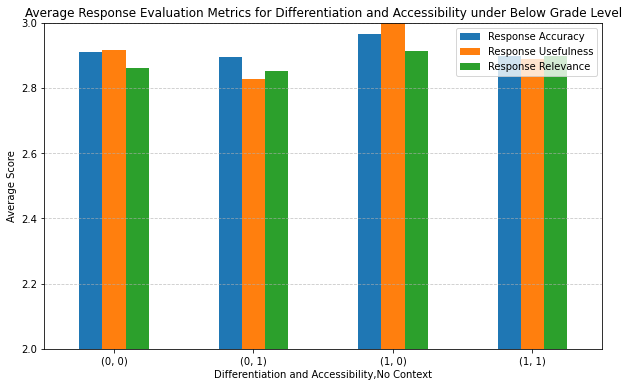

<Figure size 576x360 with 0 Axes>

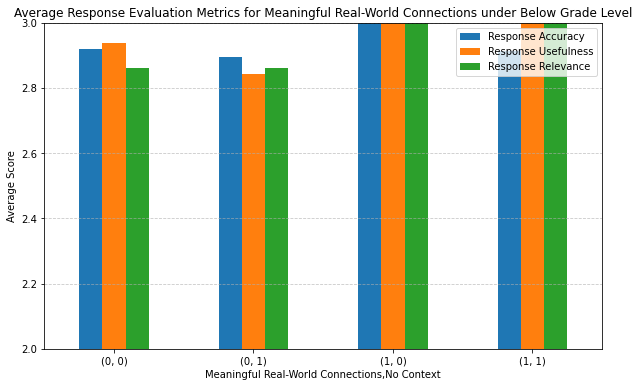

<Figure size 576x360 with 0 Axes>

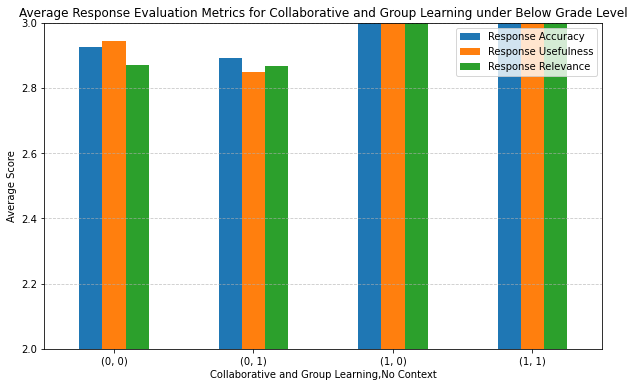

<Figure size 576x360 with 0 Axes>

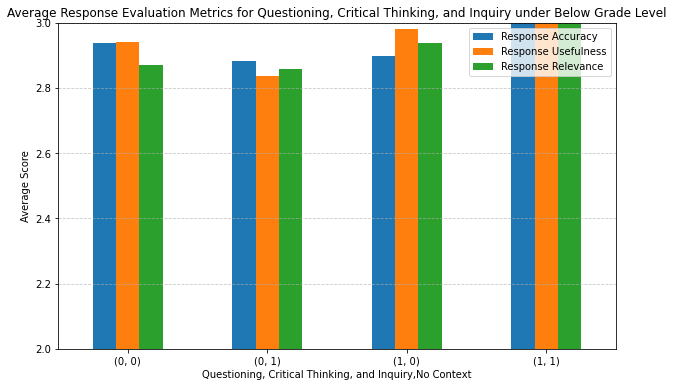

<Figure size 576x360 with 0 Axes>

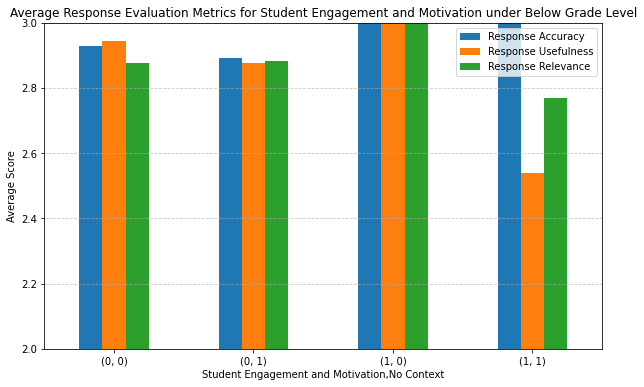

<Figure size 576x360 with 0 Axes>

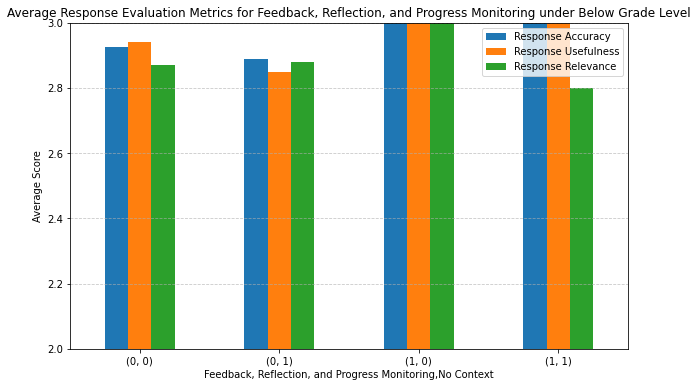

<Figure size 576x360 with 0 Axes>

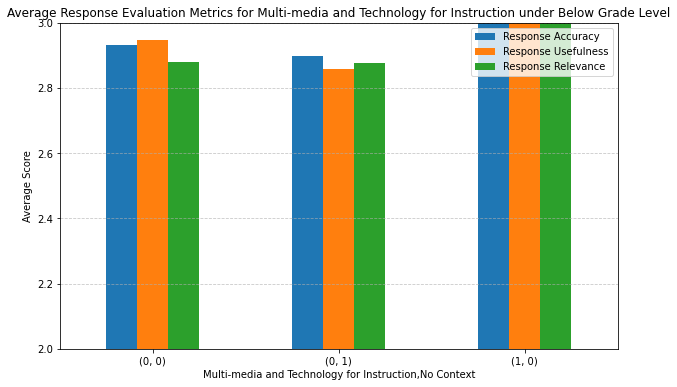

<Figure size 576x360 with 0 Axes>

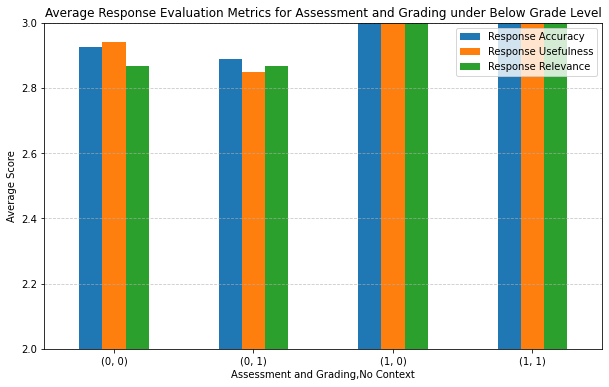

<Figure size 576x360 with 0 Axes>

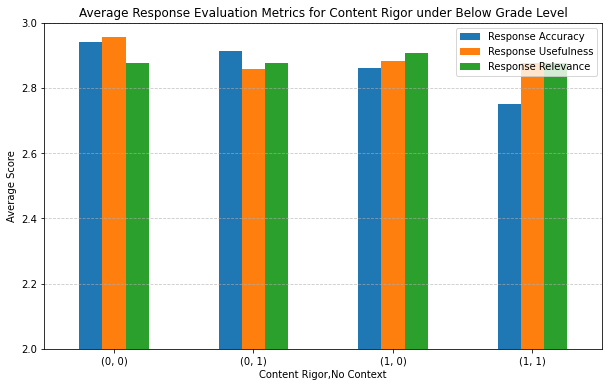

<Figure size 576x360 with 0 Axes>

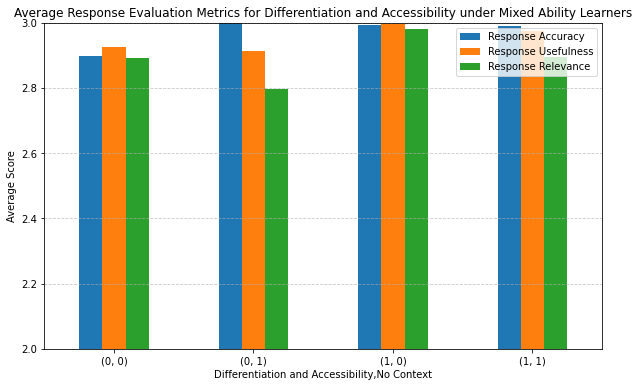

<Figure size 576x360 with 0 Axes>

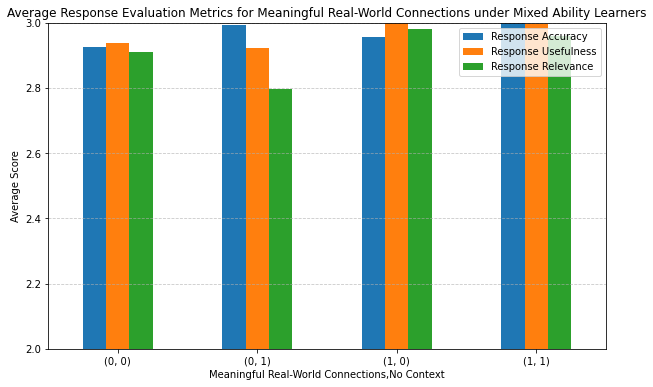

<Figure size 576x360 with 0 Axes>

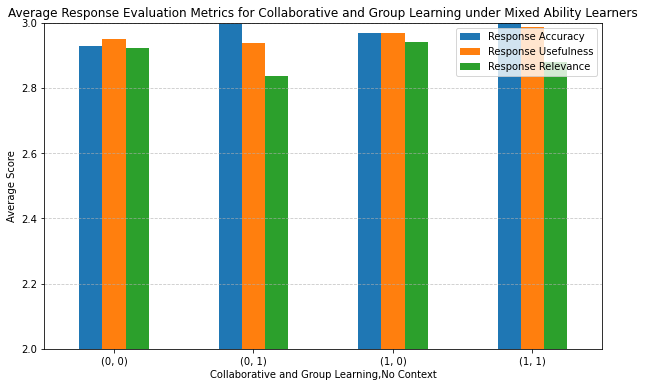

<Figure size 576x360 with 0 Axes>

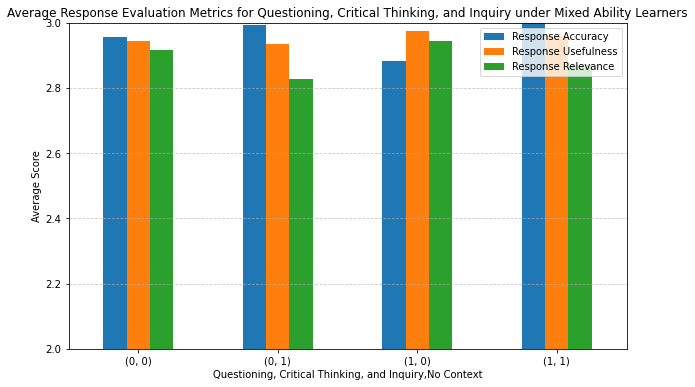

<Figure size 576x360 with 0 Axes>

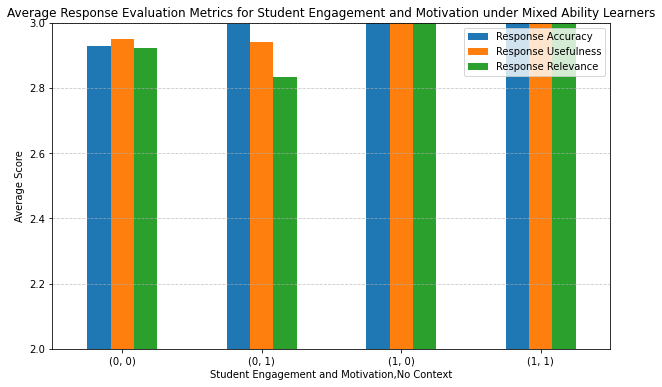

<Figure size 576x360 with 0 Axes>

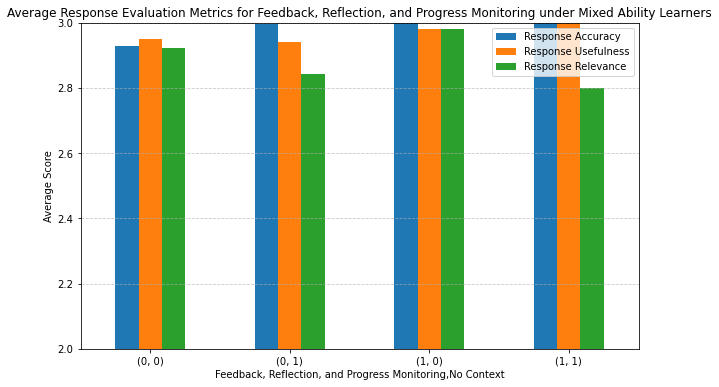

<Figure size 576x360 with 0 Axes>

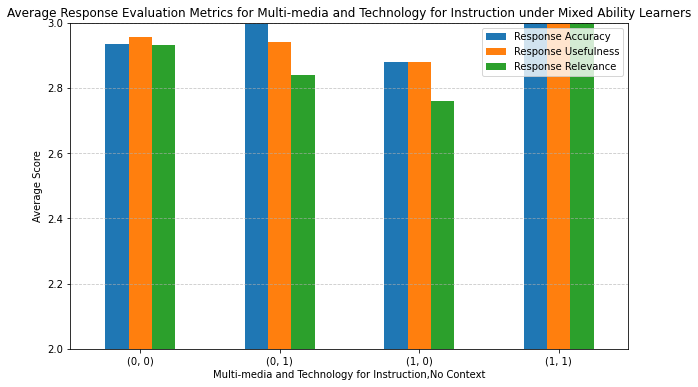

<Figure size 576x360 with 0 Axes>

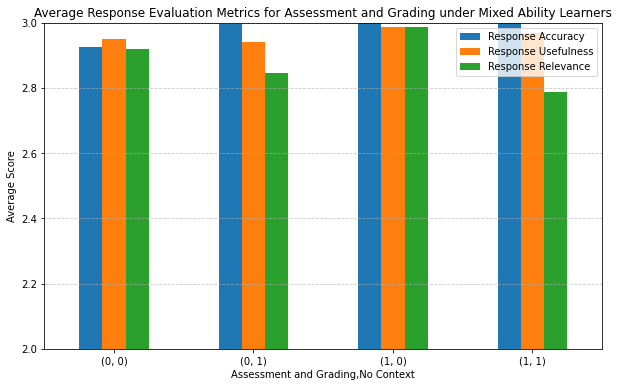

<Figure size 576x360 with 0 Axes>

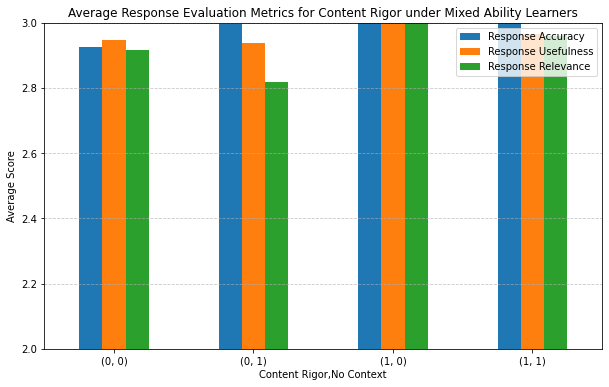

<Figure size 576x360 with 0 Axes>

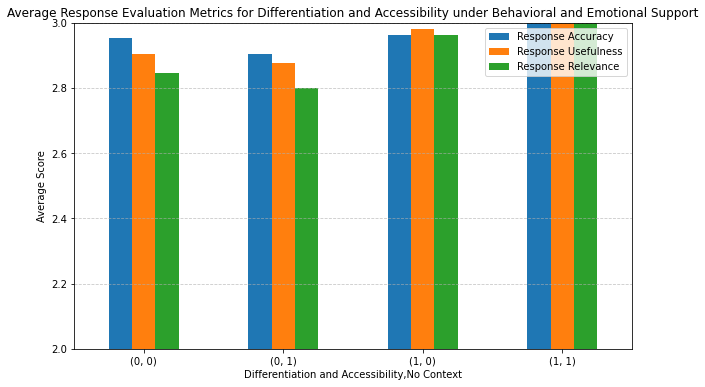

<Figure size 576x360 with 0 Axes>

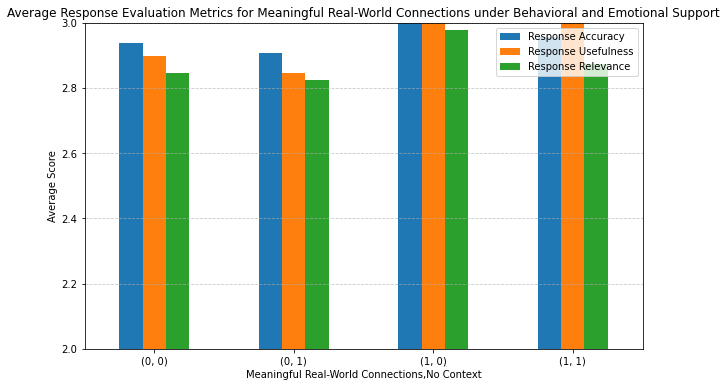

<Figure size 576x360 with 0 Axes>

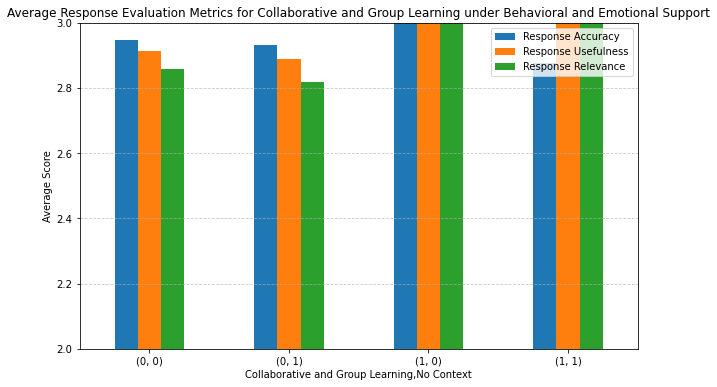

<Figure size 576x360 with 0 Axes>

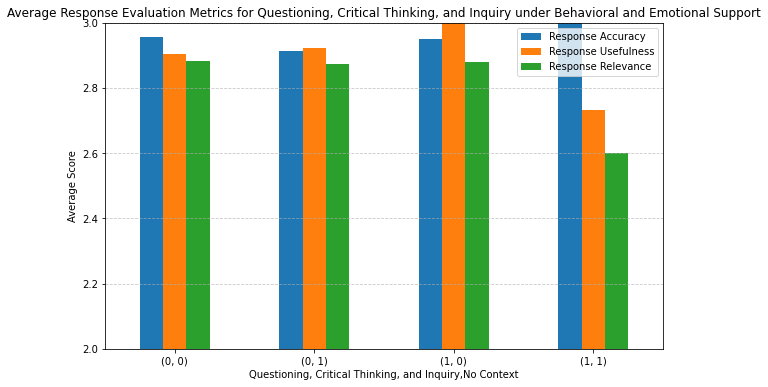

<Figure size 576x360 with 0 Axes>

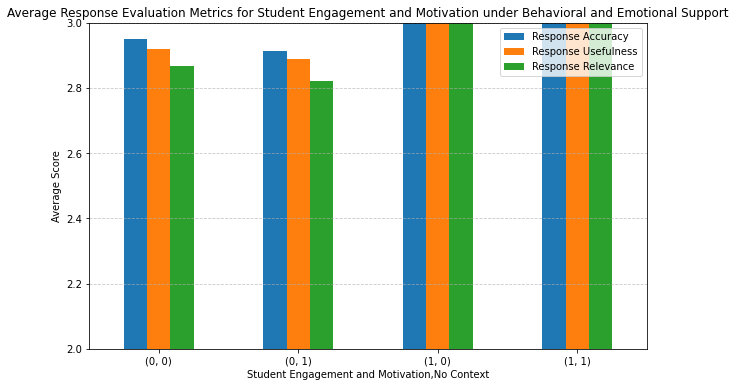

<Figure size 576x360 with 0 Axes>

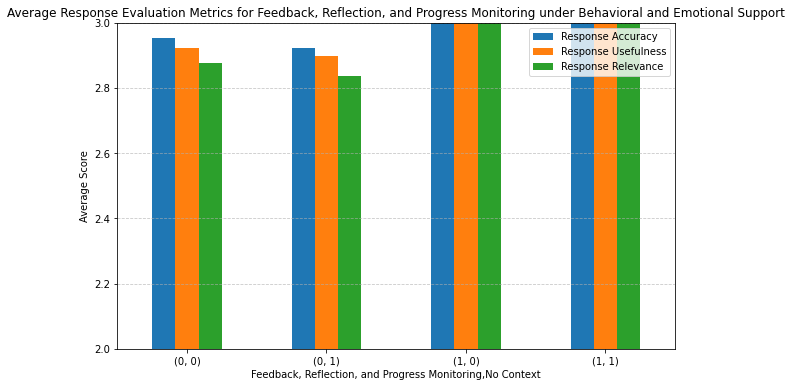

<Figure size 576x360 with 0 Axes>

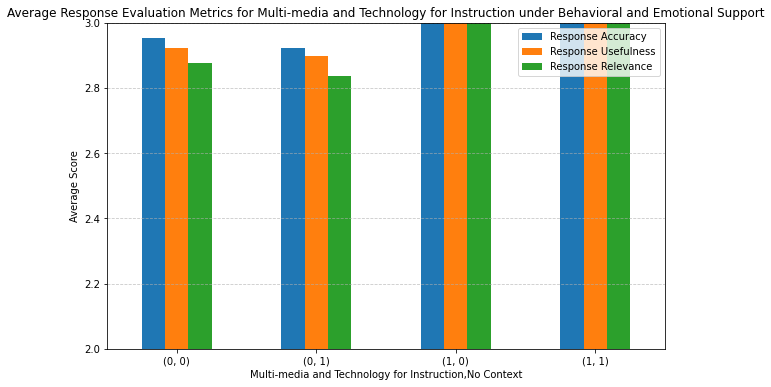

<Figure size 576x360 with 0 Axes>

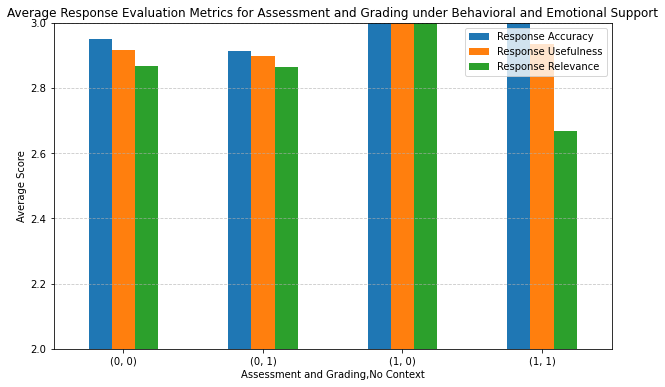

<Figure size 576x360 with 0 Axes>

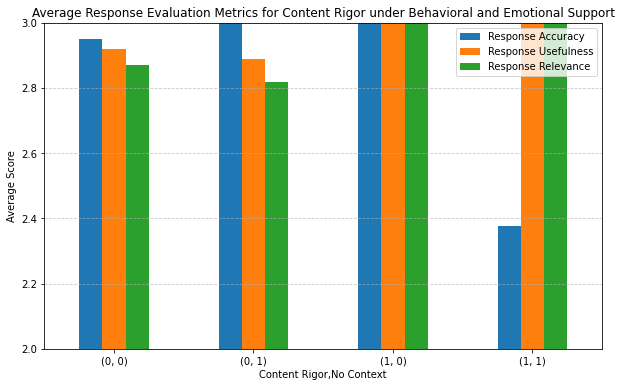

<Figure size 576x360 with 0 Axes>

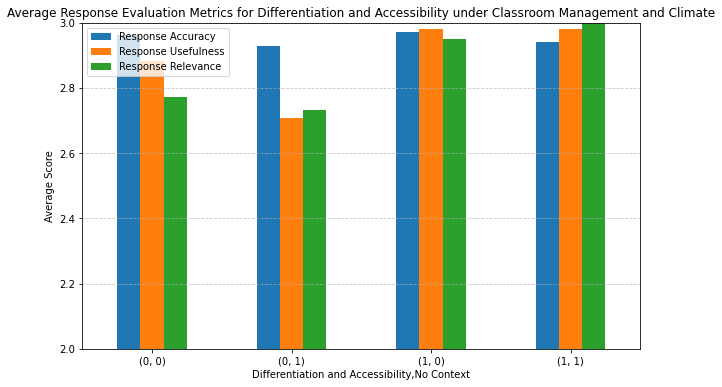

<Figure size 576x360 with 0 Axes>

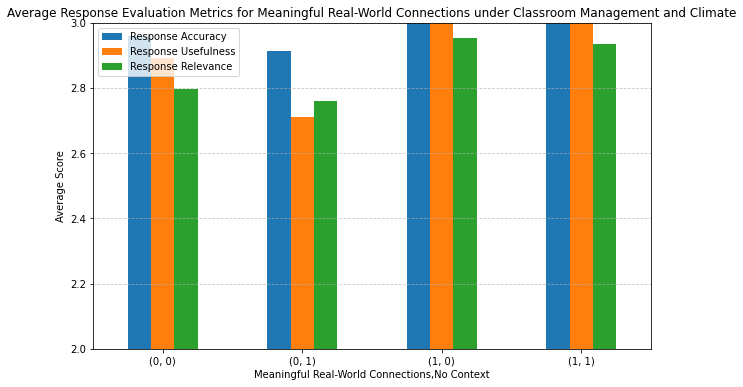

<Figure size 576x360 with 0 Axes>

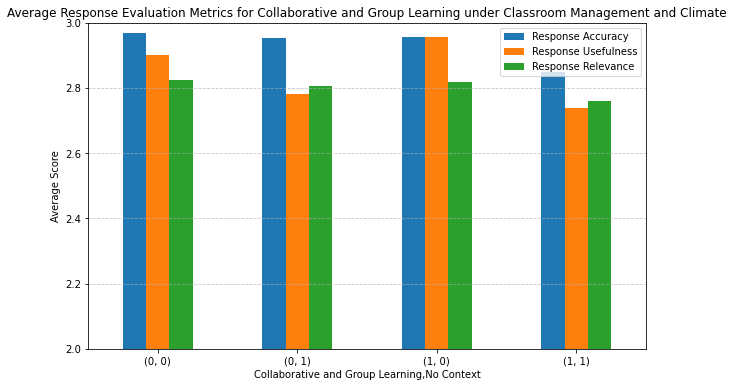

<Figure size 576x360 with 0 Axes>

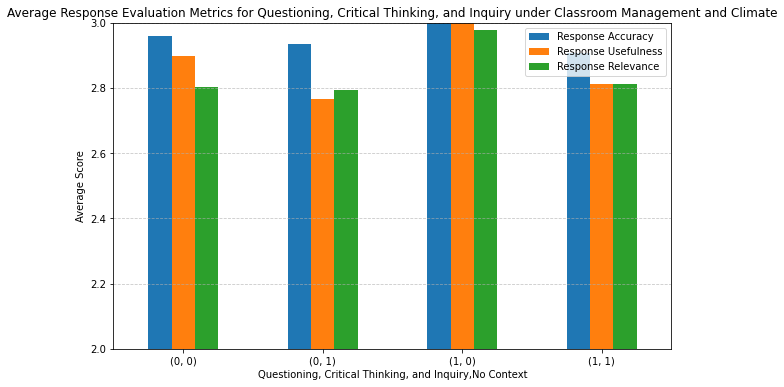

<Figure size 576x360 with 0 Axes>

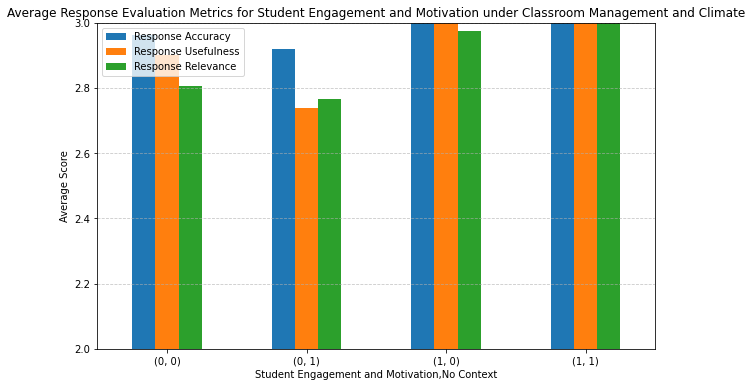

<Figure size 576x360 with 0 Axes>

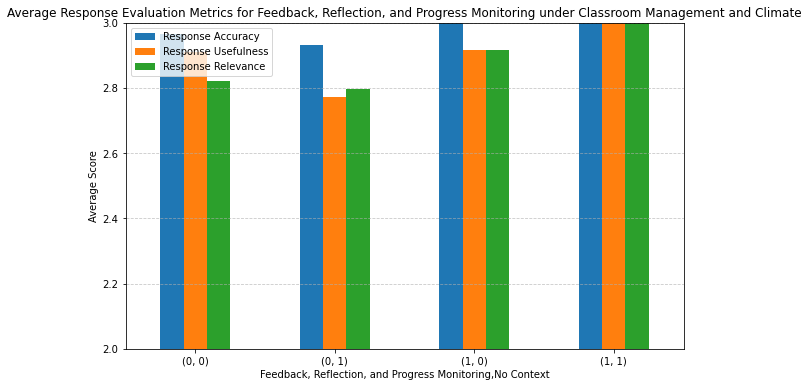

<Figure size 576x360 with 0 Axes>

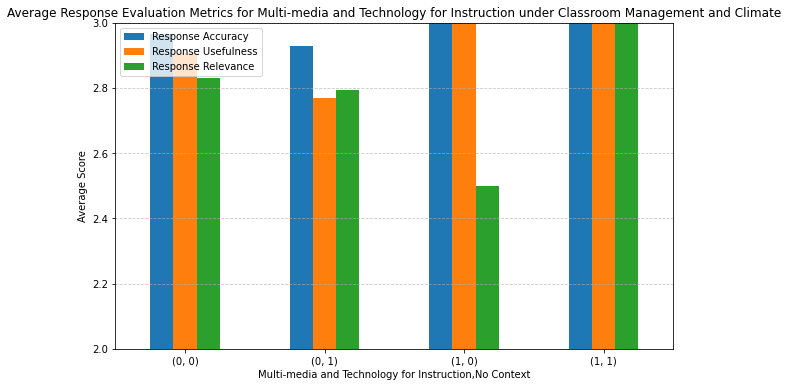

<Figure size 576x360 with 0 Axes>

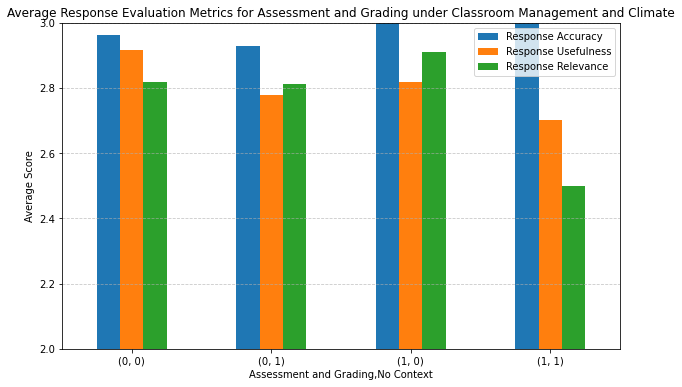

<Figure size 576x360 with 0 Axes>

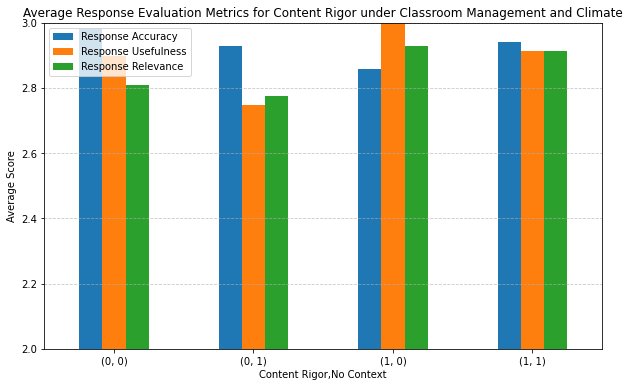

In [ ]:
for context in context_li: 
    filtered_conversation_ids = conversation_profile[conversation_profile[context] == 1]['ConversationId']

    df_filtered = df1_sorted[df1_sorted['ConversationId'].isin(filtered_conversation_ids)]

    df_filtered = df_filtered[(~df_filtered['Response Category'].isna()) & (df_filtered['Response Category'] != "None")]


    for rubrics in rubrics_li:
        avg_metrics = df_filtered.groupby([rubrics, "No Context"])[['Response Accuracy', 'Response Usefulness', 'Response Relevance']].mean()

        plt.figure(figsize=(8, 5))
        avg_metrics.plot(kind='bar', figsize=(10, 6), legend=True)
        plt.title(f"Average Response Evaluation Metrics for {rubrics} under {context}")
        plt.ylabel("Average Score")
        plt.ylim(2, 3)
        plt.xticks(rotation=0)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()

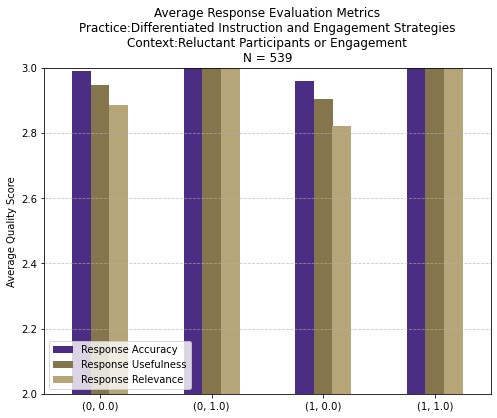

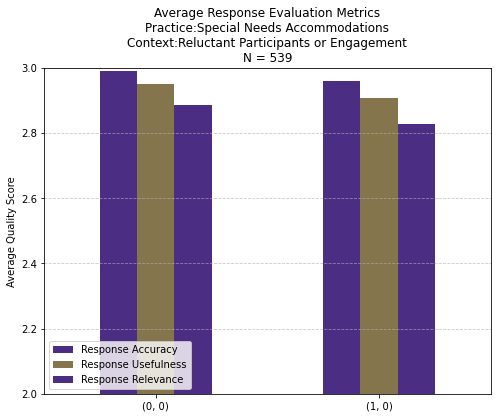

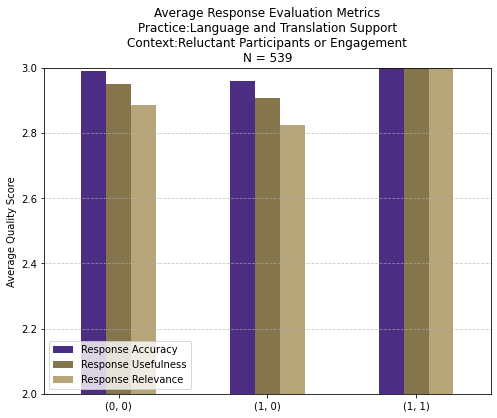

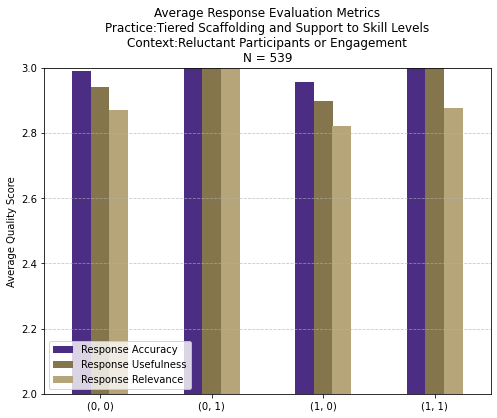

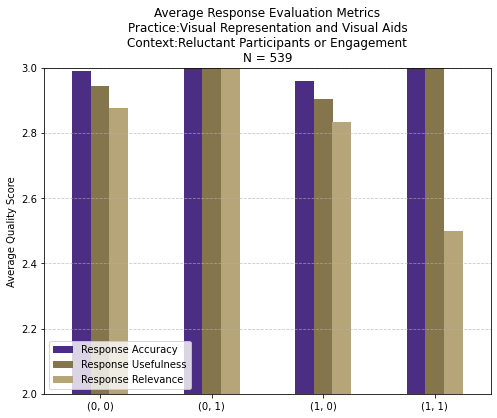

...

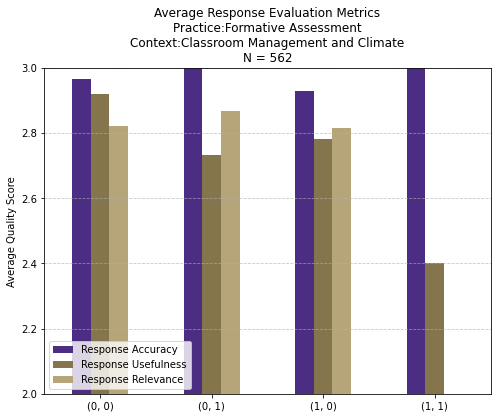

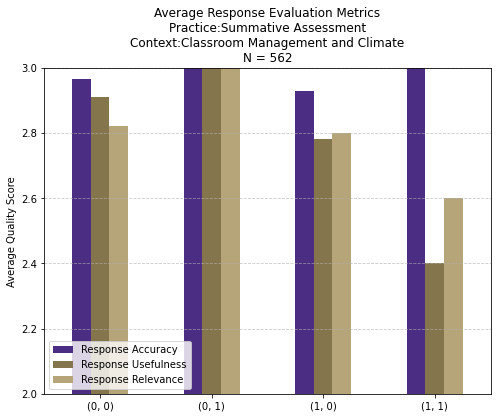

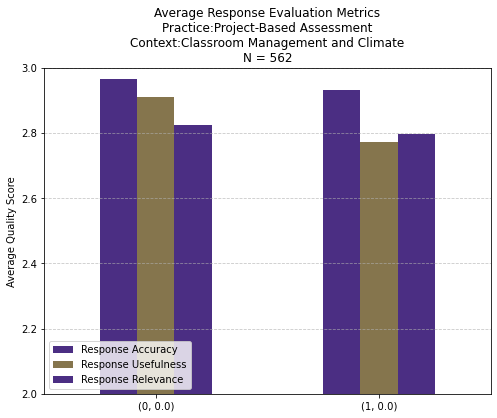

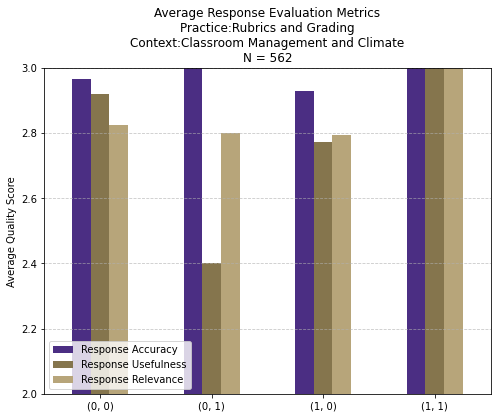

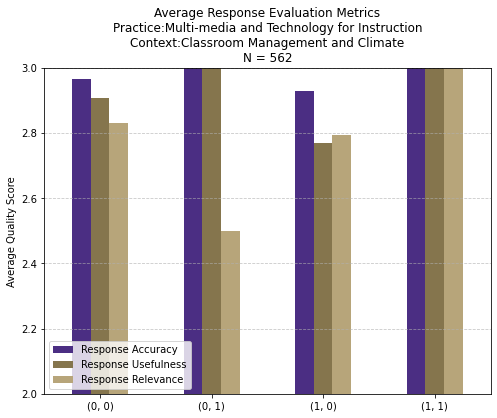

In [ ]:

for context in context_li: 
    filtered_conversation_ids = conversation_profile[conversation_profile[context] == 1]['ConversationId']

    df_filtered = df1_sorted[df1_sorted['ConversationId'].isin(filtered_conversation_ids)]

    df_filtered = df_filtered[(~df_filtered['Response Category'].isna()) & (df_filtered['Response Category'] != "None")]


    for practice in practice_li:
        avg_metrics = df_filtered.groupby(["No Context", practice])[['Response Accuracy', 'Response Usefulness', 'Response Relevance']].mean()
        fig, ax = plt.subplots(figsize=(8, 6))
        avg_metrics.plot(kind='bar', ax=ax, legend=True, color=uw_colors[:len(avg_metrics)])
        ax.set_xlabel("")  
        plt.title(f"Average Response Evaluation Metrics\nPractice:{practice}\nContext:{context}\nN = {len(df_filtered)}")
        plt.ylabel("Average Quality Score")
        plt.ylim(2, 3)
        plt.xticks(rotation=0)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.legend(loc="lower left")
        plt.show()

In [ ]:
combined_result = None

for practice in practice_li:
    grouped = df_filtered.groupby(["No Context", practice])
    current_df = grouped.size().reset_index(name=f'Count_{practice}')
    
    if combined_result is None:
        combined_result = current_df
    else:
        combined_result = combined_result.merge(current_df, on="No Context", how="outer")

In [ ]:
# Create an empty DataFrame to accumulate results
N_adapt = pd.DataFrame()

# Iterate over contexts and practices
for context in context_li:
    filtered_conversation_ids = conversation_profile[conversation_profile[context] == 1]['ConversationId']
    df_filtered = df1_sorted[df1_sorted['ConversationId'].isin(filtered_conversation_ids)]
    df_filtered = df_filtered[(~df_filtered['Response Category'].isna()) & (df_filtered['Response Category'] != "None")]

    for practice in practice_li:
        # Calculate average metrics for each group
        group = df_filtered.groupby(["No Context", practice]).size().reset_index(name='Size')
        group['Context'] = context  # Add the context column to identify each group's context
        group['Practice'] = practice  # Add the practice column if not already part of the groupby

        # Append the result to the main DataFrame
        N_adapt = pd.concat([N_adapt, group], ignore_index=True)


# Save all collected data to a CSV file

In [ ]:
N_adapt

,No Context,Differentiated Instruction and Engagement Strategies,Size,Context,Practice,Special Needs Accommodations,Language and Translation Support,Tiered Scaffolding and Support to Skill Levels,Visual Representation and Visual Aids,Real-World Examples,...,Provide Feedback for Assessment,Progress Monitoring and Data Tracking,Aligning Instruction Materials with Learning Standards,Backward Planning and Long-Term Planning for Unit or Semester,Plan for an Entire Lesson,Formative Assessment,Summative Assessment,Project-Based Assessment,Rubrics and Grading,Multi-media and Technology for Instruction
0,0,0.0,285,Reluctant Participants or Engagement,Differentiated Instruction and Engagement Stra...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,1.0,7,Reluctant Participants or Engagement,Differentiated Instruction and Engagement Stra...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,0.0,241,Reluctant Participants or Engagement,Differentiated Instruction and Engagement Stra...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,1.0,6,Reluctant Participants or Engagement,Differentiated Instruction and Engagement Stra...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,NaN,292,Reluctant Participants or Engagement,Special Needs Accommodations,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,1,NaN,2,Classroom Management and Climate,Rubrics and Grading,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
1076,0,NaN,338,Classroom Management and Climate,Multi-media and Technology for Instruction,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1077,0,NaN,8,Classroom Management and Climate,Multi-media and Technology for Instruction,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
1078,1,NaN,212,Classroom Management and Climate,Multi-media and Technology for Instruction,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


# Reject and Accept

In [ ]:
# Create indicators for rejected and accepted responses
df1_sorted['reject'] = (df1_sorted['Followup Dynamics'].fillna('').str.contains('reject')).astype(int)
df1_sorted['accept'] = (df1_sorted['Followup Dynamics'].fillna('').str.contains('accept')).astype(int)

In [ ]:
last_rows = df1.groupby('ConversationId').tail(1)
question_indices = last_rows[last_rows['Response Category'] == 'Question'].index
df1.loc[question_indices, 'reject'] = 1

In [ ]:
(df1_sorted['reject'].sum(), df1_sorted['accept'].sum(), len(df1_sorted['reject'])-df1_sorted['accept'].sum()-df1_sorted['reject'].sum())

(367, 2230, 8576)

<Figure size 576x360 with 0 Axes>

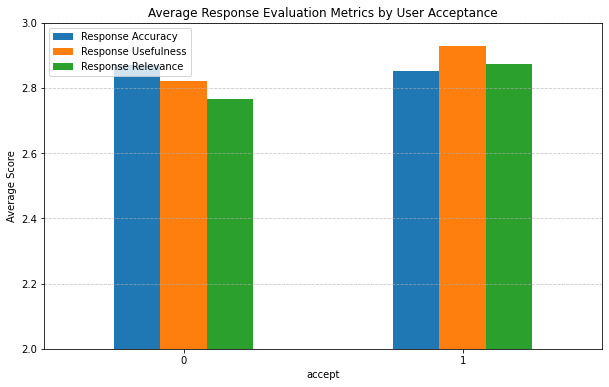

In [ ]:
# Evaluation results for AI response quality of those that accepted by users explicitly
df_filtered = df1_sorted[(~df1_sorted['Response Category'].isna()) & (df1_sorted['Response Category'] != "None")]

df_filtered['Context'] = (df_filtered['context_sum'] != 0).astype(int)
df_filtered['Practice'] = (df_filtered['practice_sum'] != 0).astype(int)
avg_metrics = df_filtered.groupby('accept')[['Response Accuracy', 'Response Usefulness', 'Response Relevance']].mean()

plt.figure(figsize=(8, 5))
avg_metrics.plot(kind='bar', figsize=(10, 6), legend=True)
plt.title("Average Response Evaluation Metrics by User Acceptance")
plt.ylabel("Average Score")
plt.ylim(2, 3)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
avg_metrics

,Response Accuracy,Response Usefulness,Response Relevance
accept,,,
0,2.869183,2.820620,2.766197
1,2.851952,2.929565,2.873486


<Figure size 576x360 with 0 Axes>

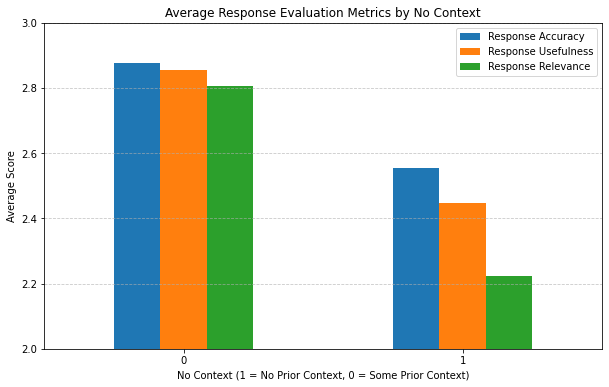

In [ ]:
# Evaluation results for AI response quality of those that rejected by users explicitly
df_filtered = df1_sorted[(~df1_sorted['Response Category'].isna()) & (df1_sorted['Response Category'] != "None")]

df_filtered['Context'] = (df_filtered['context_sum'] != 0).astype(int)
df_filtered['Practice'] = (df_filtered['practice_sum'] != 0).astype(int)
avg_metrics = df_filtered.groupby('reject')[['Response Accuracy', 'Response Usefulness', 'Response Relevance']].mean()

plt.figure(figsize=(8, 5))
avg_metrics.plot(kind='bar', figsize=(10, 6), legend=True)
plt.title("Average Response Evaluation Metrics by No Context")
plt.xlabel("No Context (1 = No Prior Context, 0 = Some Prior Context)")
plt.ylabel("Average Score")
plt.ylim(2, 3)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
avg_metrics

,Response Accuracy,Response Usefulness,Response Relevance
reject,,,
0,2.876198,2.855813,2.806665
1,2.554017,2.445983,2.224377


<Figure size 864x432 with 0 Axes>

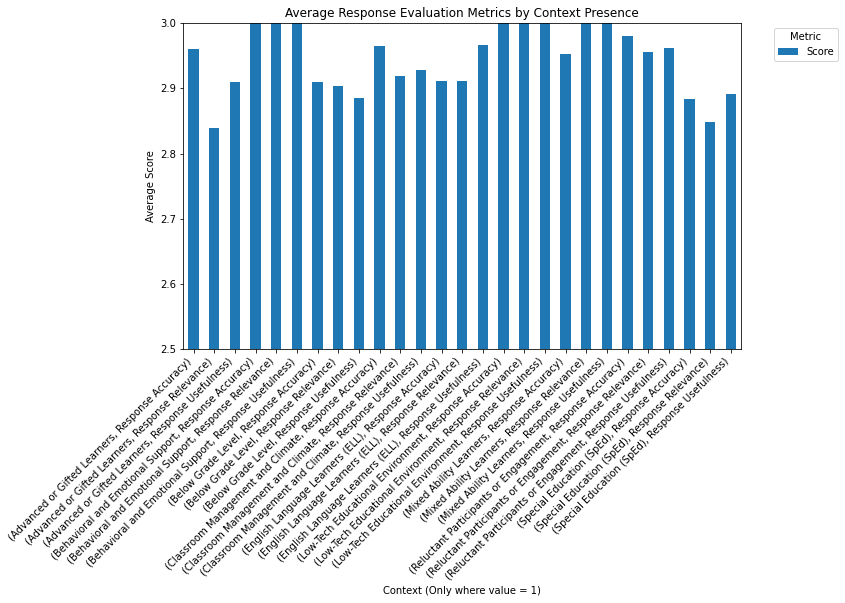

In [ ]:
# Filter the dataset based on Response Category conditions
df_filtered = df1_sorted[(~df1_sorted['Response Category'].isna()) & 
                         (df1_sorted['Response Category'] != "None")]

# Keep only rows where at least one context in context_li is 1
df_filtered = df_filtered[df_filtered[context_li].eq(1).any(axis=1)]

# Melt the DataFrame so that context names are in one column
df_melted = df_filtered.melt(id_vars=['Response Accuracy', 'Response Usefulness', 'Response Relevance'], 
                             value_vars=context_li, var_name='Context', value_name='Context_Value')

# Keep only context values that are equal to 1
df_melted = df_melted[df_melted['Context_Value'] == 1]

# Melt again to put Response Accuracy, Usefulness, and Relevance into a single column for plotting
df_melted = df_melted.melt(id_vars=['Context'], 
                           value_vars=['Response Accuracy', 'Response Usefulness', 'Response Relevance'],
                           var_name='Metric', value_name='Score')

df_melted = df_melted.groupby(['Context', 'Metric'])[['Score']].mean()
plt.figure(figsize=(12, 6))


df_melted.plot(kind='bar', figsize=(10, 6), legend=True)

# Customize the plot
plt.ylim(2.5, 3)  # Set y-axis range from 2.5 to 3
plt.xlabel("Context (Only where value = 1)")
plt.ylabel("Average Score")
plt.title("Average Response Evaluation Metrics by Context Presence")
plt.xticks(rotation=45, ha='right')
plt.legend(title="Metric", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


In [ ]:
df_melted

Score
Context                              Metric                       
Advanced or Gifted Learners          Response Accuracy    2.960000
                                     Response Relevance   2.840000
                                     Response Usefulness  2.910000
Behavioral and Emotional Support     Response Accuracy    3.000000
                                     Response Relevance   3.000000
                                     Response Usefulness  3.000000
Below Grade Level                    Response Accuracy    2.910256
                                     Response Relevance   2.903846
                                     Response Usefulness  2.884615
Classroom Management and Climate     Response Accuracy    2.964286
                                     Response Relevance   2.919643
                                     Response Usefulness  2.928571
English Language Learners (ELL)      Response Accuracy    2.911111
                                     Response Relevance   2.911111
                                     Response Usefulness  2.966667
Low-Tech Educational Environment     Response Accuracy    3.000000
                                     Response Relevance   3.000000
                                     Response Usefulness  3.000000
Mixed Ability Learners               Response Accuracy    2.952000
                                     Response Relevance   3.000000
                                     Response Usefulness  3.000000
Reluctant Participants or Engagement Response Accuracy    2.980892
                                     Response Relevance   2.955414
                                     Response Usefulness  2.961783
Special Education (SpEd)             Response Accuracy    2.884058
                                     Response Relevance   2.847826
                                     Response Usefulness  2.891304

# AI Communication Strategies

In [ ]:
# single row conversations end with AI question
conversation_counts = df1.groupby("ConversationId").size().reset_index(name="Row Count")

single_row_conversations = conversation_counts[conversation_counts["Row Count"] == 1]

single_row_conversations = single_row_conversations.merge(df1[["ConversationId", "Response Category"]], on="ConversationId", how="left")

question_count = (single_row_conversations["Response Category"] == "Question").sum()

question_count

50

In [ ]:
# conversation start with AI questions
conversation_counts = df1.groupby("ConversationId").size().reset_index(name="Row Count")

multi_row_conversations = conversation_counts[conversation_counts["Row Count"] > 1]

first_rows = df1.groupby("ConversationId").first().reset_index()

valid_conversation_ids = first_rows[(first_rows["Response Category"] == "Question") & 
                                    (first_rows["ConversationId"].isin(multi_row_conversations["ConversationId"]))]["ConversationId"]
filtered_conversations = df1[df1["ConversationId"].isin(valid_conversation_ids)]

In [ ]:
len(filtered_conversations)

2069

In [ ]:
# conversation not start with AI questions
conversation_counts = df1.groupby("ConversationId").size().reset_index(name="Row Count")

multi_row_conversations = conversation_counts[conversation_counts["Row Count"] > 1]

first_rows = df1.groupby("ConversationId").first().reset_index()

valid_conversation_ids = first_rows[(first_rows["Response Category"] != "Question") & 
                                    (first_rows["ConversationId"].isin(multi_row_conversations["ConversationId"]))]["ConversationId"]
filtered_conversations = df1[df1["ConversationId"].isin(valid_conversation_ids)]

In [ ]:
len(filtered_conversations)

7724

In [ ]:
# user provided practice after AI asks
df_filtered = df1_sorted.sort_values(by=["ConversationId", "created_date"])

# Create a shifted column for No Practice within each ConversationId
df_filtered["Next_No_Practice"] = df_filtered.groupby("ConversationId")["No Practice"].shift(-1)
df_filtered = df_filtered[(~df_filtered['Response Category'].isna()) & (df_filtered['Response Category'] != "None")]


# Identify rows where No Practice is 1, Response Category is "Question", 
# and the next row in the same ConversationId has No Practice as 0
matching_rows = df_filtered[
    (df_filtered["No Practice"] == 1) & 
    (df_filtered["Response Category"] == "Question") & 
    (df_filtered["Next_No_Practice"] == 0)
]

len(matching_rows)

410

In [ ]:
# user provided practice without AI questions
df_filtered = df1_sorted.sort_values(by=["ConversationId", "created_date"])

# Create a shifted column for No Practice within each ConversationId
df_filtered["Next_No_Practice"] = df_filtered.groupby("ConversationId")["No Practice"].shift(-1)
df_filtered = df_filtered[(~df_filtered['Response Category'].isna()) & (df_filtered['Response Category'] != "None")]


# Identify rows where No Practice is 1, Response Category is not "Question", 
# and the next row in the same ConversationId has No Practice as 0
matching_rows = df_filtered[
    (df_filtered["No Practice"] == 1) & 
    (df_filtered["Response Category"] != "Question") & 
    (df_filtered["Next_No_Practice"] == 0)
]

len(matching_rows)

1312

In [ ]:
# user provided cpontext after AI asks
df_filtered = df1_sorted.sort_values(by=["ConversationId", "created_date"])

# Create a shifted column for No Practice within each ConversationId
df_filtered["Next_No_Context"] = df_filtered.groupby("ConversationId")["No Context"].shift(-1)

# Identify rows where No Practice is 1, Response Category is "Question", 
# and the next row in the same ConversationId has No Practice as 0
matching_rows_context_q = df_filtered[
    (df_filtered["No Context"] == 1) & 
    (df_filtered["Response Category"] == "Question") & 
    (df_filtered["Next_No_Context"] == 0)
]

len(matching_rows_context_q)

93

In [ ]:
# user provided practice without AI questions
df_filtered = df1_sorted.sort_values(by=["ConversationId", "created_date"])

# Create a shifted column for No Practice within each ConversationId
df_filtered["Next_No_Context"] = df_filtered.groupby("ConversationId")["No Context"].shift(-1)
df_filtered = df_filtered[(~df_filtered['Response Category'].isna()) & (df_filtered['Response Category'] != "None")]


# Identify rows where No Practice is 1, Response Category is not "Question", 
# and the next row in the same ConversationId has No Practice as 0
matching_rows_context = df_filtered[
    (df_filtered["No Context"] == 1) & 
    (df_filtered["Response Category"] != "Question") & 
    (df_filtered["Next_No_Context"] == 0)
]

len(matching_rows_context)

530

In [ ]:
matching_ids_q = matching_rows_context_q["id"]

df_filtered_matched = df_filtered[df_filtered["id"].isin(matching_ids_q)]

df_following_rows = df_filtered_matched.groupby("ConversationId").apply(
    lambda group: df_filtered.loc[group.index + 1]).reset_index(drop=True)

df_filtered_matched_q = df_following_rows[context_li]
df_filtered_matched_q["AI asked"] = 1

matching_ids = matching_rows_context["id"]

df_filtered_matched = df_filtered[df_filtered["id"].isin(matching_ids)]

df_following_rows = df_filtered_matched.groupby("ConversationId").apply(
    lambda group: df_filtered.loc[group.index + 1]).reset_index(drop=True)

df_filtered_matched = df_following_rows[context_li]
df_filtered_matched["AI asked"] = 0

df_filtered_matched = pd.concat([df_filtered_matched, df_filtered_matched_q])


In [ ]:
df_filtered_matched

,Reluctant Participants or Engagement,Low-Tech Educational Environment,Special Education (SpEd),English Language Learners (ELL),Advanced or Gifted Learners,Below Grade Level,Mixed Ability Learners,Behavioral and Emotional Support,Classroom Management and Climate,AI asked
0,0.0,0.0,0.0,0.0,0,0.0,0,0,1.0,0
1,0.0,0.0,0.0,0.0,0,0.0,0,0,0.0,0
2,0.0,0.0,0.0,0.0,0,0.0,1,0,0.0,0
3,0.0,0.0,0.0,0.0,0,0.0,1,0,0.0,0
4,0.0,0.0,0.0,0.0,1,0.0,0,0,0.0,0
...,...,...,...,...,...,...,...,...,...,...
88,0.0,0.0,0.0,0.0,0,0.0,0,0,0.0,1
89,0.0,0.0,0.0,0.0,0,0.0,0,1,0.0,1
90,1.0,0.0,0.0,0.0,0,0.0,0,0,0.0,1
91,0.0,0.0,0.0,0.0,0,0.0,0,0,0.0,1


<Figure size 864x432 with 0 Axes>

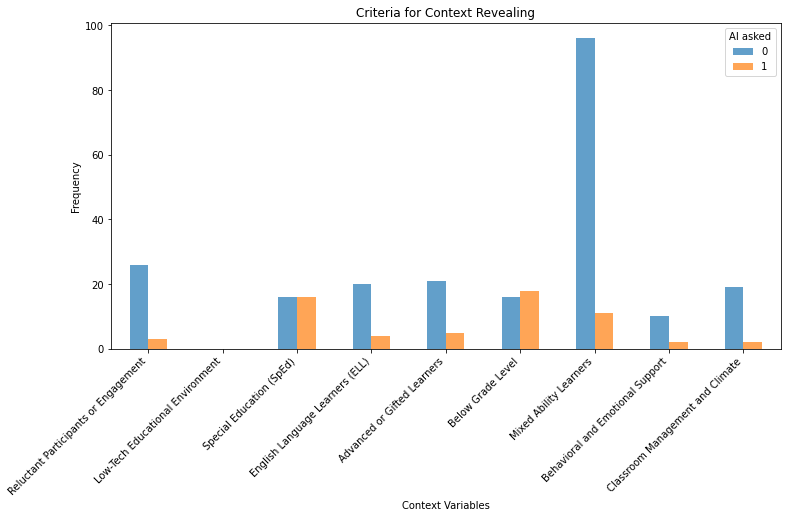

In [ ]:
# how often users provide context due to AI question vs. how often users provide context without AI questions
context_counts = df_filtered_matched.groupby("AI asked")[context_li].sum()

plt.figure(figsize=(12, 6))
context_counts.T.plot(kind='bar', figsize=(12, 6), legend=True, alpha=0.7)

plt.title("Criteria for Context Revealing")
plt.xlabel("Context Variables")
plt.ylabel("Frequency")
plt.xticks(rotation=45, ha='right')
plt.show()

In [ ]:
context_counts

,Reluctant Participants or Engagement,Low-Tech Educational Environment,Special Education (SpEd),English Language Learners (ELL),Advanced or Gifted Learners,Below Grade Level,Mixed Ability Learners,Behavioral and Emotional Support,Classroom Management and Climate
AI asked,,,,,,,,,
0,26.0,0.0,16.0,20.0,21,16.0,96,10,19.0
1,3.0,0.0,16.0,4.0,5,18.0,11,2,2.0
